# Scikit Learn Decision Tree: Testing and Implementation Workflow
## Kevin Jaggs Dec 2020

* Step 1 -  [Import The required python modules](#section_id_import_modules)
* Step 2 -  [Read csv file to pandas](#section_id_read_csv)
* Step 3 -  [Test and train X/y input/output datasets](#section_id_test_train_split)
* Step 4 -  [Create and run a default sklearn decision tree classifier](#section_id_default_tree)
* Step 5 -  [Post pruning decision trees with cost complexity pruning](#section_id_prune_tree)
* Step 6 -  [Post pruning decision trees nodes and depth of tree vs alpha](#section_id_prune_tree_alpha)
* Step 7 -  [Accuracy vs alpha for training and testing sets](#section_id_prune_tree_accuracy_alpha)
* Step 8 -  [Classification report of pruned tree](#section_id_prune_tree_classification)
* Step 9 -  [Test decision tree for tree depth sensitivity](#section_id_tree_depth_sensitivity)
* Step 10 -  [Test decision tree for tree min samples sensitivity](#section_id_tree_minsamples_sensitivity)
* Step 12 -  [Test decision tree for tree min samples leaf sensitivity](#section_id_tree_minsamplesleaf_sensitivity)
* Step 13 -  [Test decision tree for tree max features sensitivity](#section_id_tree_maxfeatures_sensitivity)
* Step 14 -  [Create and run a default sklearn decision tree classifier](#section_id_tree_gridsearch)
* Step 15 -  [Create and run a default sklearn decision tree classifier](#section_id_tree_gridsearch_bestfeatures)
* Step 16 -  [Create and run a default sklearn decision tree classifier](#section_id_tree_gridsearch_features)



<a id='section_id_import_modules'></a>

### Step 1 - Import the required python modules
Define pandas, numpy and sklearn imports

In [1]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn import tree
from sklearn.metrics import accuracy_score, plot_confusion_matrix,classification_report

from sklearn.metrics import roc_curve, roc_auc_score, auc

import matplotlib.pyplot as plt
import matplotlib as mpl


 

<a id='section_id_read_csv'></a>

### Step 2 - Read CSV file to pandas
Read the select csv file into pandas, currently loaded dataset is comma separated with a header column at row=0
Minor data conditionaing applied: columns modified to numeric, NaN values replaced with a zero value
Future steps: add a more robust missing data replacement module
Returns a pandas dataframe named df

In [2]:
def readcsvfile():
    '''
    (csv)->(pandas dataframe)
    routine to read import csv file to pandas
    comma separation, column headers = first row of text
    All column data is considered numeric
    Index = row 
    -999.25 values are converted to numpy NaN
    PRECONDITION: Import csv file is the correct format. All prospects without a 1/0 output removed.
    KJAGGS June 2020
    '''
    
    #read csv file to pandas dataframe
    df = pd.read_csv('classification_dataset.csv', encoding = 'utf-8',header=0,sep=',')
    df = df.set_index('Row ID')
    df = df.apply(pd.to_numeric, errors='ignore')
    df = df.replace(-999.25,np.NaN)
    df = df.replace(np.NaN,0)
    #print(df.isnull().any())
    return df

df = readcsvfile()

###optional qc features - remove hash/# to view 
print(df.head)
#print(df.columns.tolist)


print("Dataframe size on import")
print("Number of prospects :", df.shape[0])
print("Number of data categories :", df.shape[1])


<bound method NDFrame.head of               Category 1  Category 2  Category 3  Category 4  Category 5  \
Row ID                                                                     
Data Row 1          0.26    0.312913           4           5           4   
Data Row 2          0.09    0.298611           4           3           4   
Data Row 3          0.17    0.129717           4           4           2   
Data Row 4          0.36    0.067347           4           4           2   
Data Row 5          0.16    0.059782           4           4           3   
...                  ...         ...         ...         ...         ...   
Data Row 348        0.41    0.072581           4           4           2   
Data Row 349        0.10    0.075154           4           4           3   
Data Row 350        0.32    0.141702           4           2           4   
Data Row 351        0.16    0.119604           4           4           3   
Data Row 352        0.43   -0.012649           3          

<a id='section_id_test_train_split'></a>

### Step 3 - Test Train Split subroutine
Split into X & y test/train datasets.
User option to specifiy test data proportion, stratify, use a seed integer or shuffle.

In [3]:
def training_split(Xdata, Ydata, test_size=0.2,stratify=None,random_state=None,shuffle=False):
    '''
    (DataframeXColumns)(DataframeYColumn)=>(array)(array)(array)(array)
    For the purposes of splitting x and y data into test and training sets
    train_test_split is currently set to default settings
    PRECONDITION: Input datasets are formatted correctly
    KJAGGS June2020
    '''

    #split the data - default settings for now
    X_train, X_test, y_train, y_test = train_test_split(Xdata, Ydata, test_size=test_size,stratify=stratify, random_state = random_state, shuffle = shuffle)

    #resize the output data sets if a 1 column vector, now compatible  with regression modules
    if len(X_train.shape) <2:  
       X_train = X_train.ravel()
    if len(y_train.shape) <2:  
       y_train = y_train.ravel()
    if len(X_test.shape) <2:  
       X_test = X_test.ravel()
    if len(y_train.shape) <2:  
       y_test = y_test.ravel()
    
    return X_train, X_test, y_train, y_test

#print(df.columns.tolist())
#output dataset is success/fail only
print(df.shape)

#remove result column from input dataset
y = df[df.columns[-1]]

#X = df.drop(df.columns[[-1]], axis=1)
X = df.drop(df.columns[[1,-1]], axis=1)
#X = df.drop(df.columns[[0,1,-1]], axis=1)


#split the datasets
#Shuffle = randomly shuffle the data before, If shuffle=False then stratify must be None.
#random state = seeding of random numbers for reproducibility across various modules
#stratify = ensure proportion of outcomes are the same across both datasets i.e % of successes in train = % of successes in test
X_train, X_test, y_train, y_test = training_split(X,y,shuffle=True,random_state=100,stratify=y,test_size=0.25)

print("Train and test dataset sizes")
print("Training dataset size :", X_train.shape)
print("Test dataset size :", X_test.shape)

(352, 43)
Train and test dataset sizes
Training dataset size : (264, 41)
Test dataset size : (88, 41)


<a id='section_id_default_tree'></a>

### Step 4 - Create and run a default sklearn decision tree classifier
Run with default parameters, except random state seed point.
Plot accuracy score and demonstrate effectiveness using a confusion matrix and classification report

Default sklearn decision tree module

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=36, splitter='best')

Accuracy score using raw sklearn decision tree parameters = 0.6818181818181818
              precision    recall  f1-score   support

           0       0.66      0.66      0.66        41
           1       0.70      0.70      0.70        47

    accuracy                           0.68        88
   macro avg       0.68      0.68      0.68        88
weighted avg       0.68      0.68      0.68        88



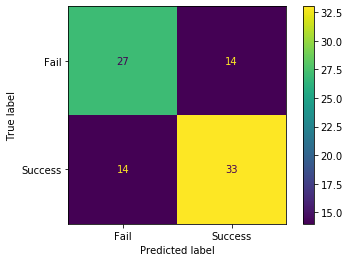

In [4]:

print("Default sklearn decision tree module\n")

random_state_int = 36

model = tree.DecisionTreeClassifier(random_state = random_state_int)
print(model)

model.fit(X_train, y_train)
y_raw_predict = model.predict(X_test)

raw_accuracy_score = accuracy_score(y_test, y_raw_predict)
print("\nAccuracy score using raw sklearn decision tree parameters =", raw_accuracy_score)
plot_confusion_matrix(model,X_test,y_test, display_labels=["Fail","Success"])

#scikit learn classification report
print(classification_report(y_test, y_raw_predict))

# get importance
#importance = model.feature_importances_
# summarize feature importance
#for i,v in enumerate(importance):
#    print('Feature: %0d, Score: %.5f' % (i,v))
#print(importance.shape)    
#print(df_saam.columns.tolist())


<a id='section_id_prune_tree'></a>

### Step 5 - Post pruning decision trees with cost complexity pruning
Taken from scikitlearn help pages.
https://scikit-learn.org/0.22/auto_examples/tree/plot_cost_complexity_pruning.html
The DecisionTreeClassifier provides parameters such as min_samples_leaf and max_depth to prevent a tree from overfiting. 
Cost complexity pruning provides another option to control the size of a tree. 
In DecisionTreeClassifier, this pruning technique is parameterized by the cost complexity parameter, ccp_alpha. 
Greater values of ccp_alpha increase the number of nodes pruned

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

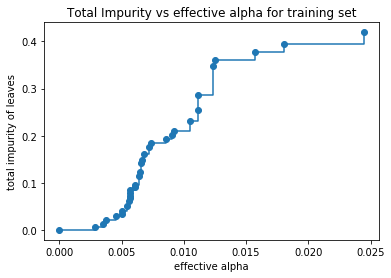

In [5]:
#https://scikit-learn.org/0.22/auto_examples/tree/plot_cost_complexity_pruning.html

path = model.cost_complexity_pruning_path(X_train,y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")


<a id='section_id_prune_tree_alpha'></a>

### Step 6 - Post pruning decision trees nodes and depth of tree vs alpha

Number of nodes in the last tree is: 1 with ccp_alpha: 0.07862027139691113


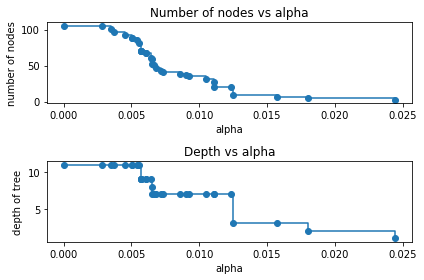

In [6]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = tree.DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(X_train, y_train)
    clfs.append(clf)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1]))

clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1)
ax[0].plot(ccp_alphas, node_counts, marker='o', drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker='o', drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

<a id='section_id_prune_tree_accuracy_alpha'></a>

### Step 7 - Accuracy vs alpha for training and testing sets
When ccp_alpha is set to zero and keeping the other default parameters of DecisionTreeClassifier, the tree overfits, leading to a 100% training accuracy and 88% testing accuracy. As alpha increases, more of the tree is pruned, thus creating a decision tree that generalizes better. In this example, setting ccp_alpha=0.011 maximizes the testing accuracy.

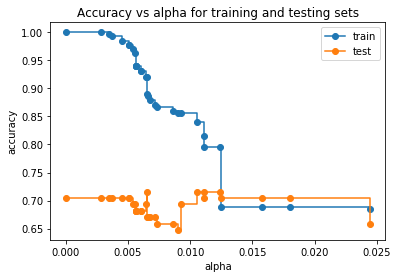

In [7]:
#https://scikit-learn.org/0.22/auto_examples/tree/plot_cost_complexity_pruning.html

train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()

<a id='section_id_prune_tree_alpha_classification'></a>

### Step 8 - Classification report of pruned tree
Create confusion matrix and classification report for the pruned tree with optimised alpha value

              precision    recall  f1-score   support

           0       0.77      0.56      0.65        41
           1       0.69      0.85      0.76        47

    accuracy                           0.72        88
   macro avg       0.73      0.71      0.70        88
weighted avg       0.73      0.72      0.71        88



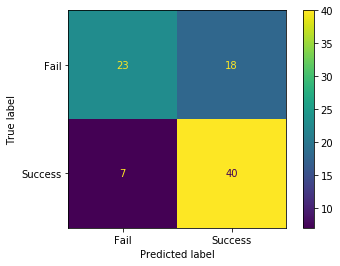

In [8]:
model_pruned = tree.DecisionTreeClassifier(random_state = 42, ccp_alpha=0.0115)
model_pruned = model_pruned.fit(X_train,y_train)

plot_confusion_matrix(model_pruned,X_test,y_test, display_labels=["Fail","Success"])

y_pruned_predict = model_pruned.predict(X_test)

print(classification_report(y_test, y_pruned_predict))

<a id='section_id__tree_depth_sensitivity'></a>

### Step 9 -Test decision tree for tree depth sensitivity
Apply range of values and review AUC scores for test and train datasets

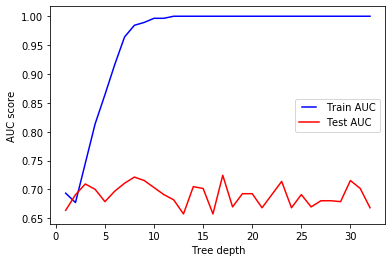

In [9]:


param_text = 'max_depth='
max_depths = np.linspace(1, 32, 32, endpoint=True)
train_results = []
test_results = []
for max_depth_mod in max_depths:
   dt = tree.DecisionTreeClassifier(max_depth=max_depth_mod)
   dt.fit(X_train, y_train)
   train_pred = dt.predict(X_train)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   # Add auc score to previous train results
   train_results.append(roc_auc)
   y_pred = dt.predict(X_test)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   # Add auc score to previous test results
   test_results.append(roc_auc)

    
from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(max_depths, train_results, 'b', label="Train AUC")
line2, = plt.plot(max_depths, test_results, 'r', label="Test AUC")
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel('AUC score')
plt.xlabel('Tree depth')
plt.show()

<a id='section_id__tree_minsamples_sensitivity'></a>

### Step 10 -Test decision tree for min samples sensitivity
Apply range of values and review AUC scores for test and train datasets

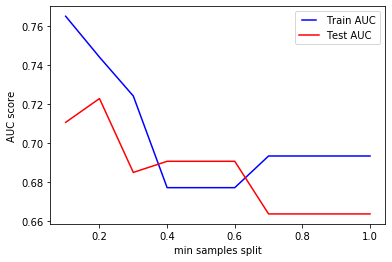

In [10]:
min_samples_splits = np.linspace(0.1, 1.0, 10, endpoint=True)
train_results = []
test_results = []
for min_samples_split in min_samples_splits:
   dt = tree.DecisionTreeClassifier(min_samples_split=min_samples_split)
   dt.fit(X_train, y_train)
   train_pred = dt.predict(X_train)
   false_positive_rate, true_positive_rate, thresholds =    roc_curve(y_train, train_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   train_results.append(roc_auc)
   y_pred = dt.predict(X_test)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   test_results.append(roc_auc)
from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(min_samples_splits, train_results, 'b', label="Train AUC")
line2, = plt.plot(min_samples_splits, test_results, 'r', label="Test AUC")
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel('AUC score')
plt.xlabel('min samples split')
plt.show()

<a id='section_id__tree_minsamplesleaf_sensitivity'></a>

### Step 11 -Test decision tree for min samples leaf sensitivity
Apply range of values and review AUC scores for test and train datasets

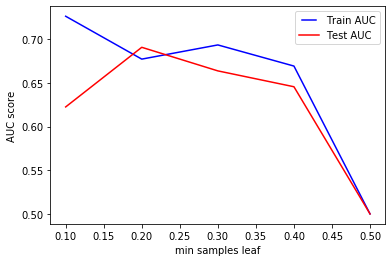

In [11]:
min_samples_leafs = np.linspace(0.1, 0.5, 5, endpoint=True)
train_results = []
test_results = []
for min_samples_leaf in min_samples_leafs:
   dt = tree.DecisionTreeClassifier(min_samples_leaf=min_samples_leaf)
   dt.fit(X_train, y_train)
   train_pred = dt.predict(X_train)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   train_results.append(roc_auc)
   y_pred = dt.predict(X_test)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   test_results.append(roc_auc)
from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(min_samples_leafs, train_results, 'b', label="Train AUC")
line2, = plt.plot(min_samples_leafs, test_results, 'r', label="Test AUC")
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel('AUC score')
plt.xlabel('min samples leaf')
plt.show()

<a id='section_id__tree_maxfeatures_sensitivity'></a>

### Step 12 -Test decision tree for max features sensitivity
Apply range of values and review AUC scores for test and train datasets

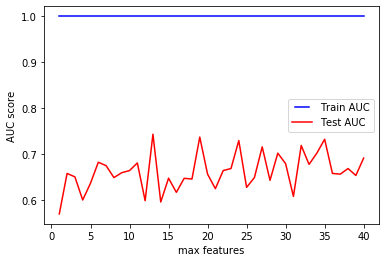

In [12]:
max_features = list(range(1,X_train.shape[1]))
train_results = []
test_results = []
for max_feature in max_features:
   dt = tree.DecisionTreeClassifier(max_features=max_feature)
   dt.fit(X_train, y_train)
   train_pred = dt.predict(X_train)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   train_results.append(roc_auc)
   y_pred = dt.predict(X_test)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   test_results.append(roc_auc)
from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(max_features, train_results, 'b', label="Train AUC")
line2, = plt.plot(max_features, test_results, 'r', label="Test AUC")
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel('AUC score')
plt.xlabel('max features')
plt.show()

<a id='section_id__tree_gridsearch'></a>

### Step 13 - Tune hyperparameters using gridsearch cv
Tune criterion, min_samples_split, max_depth, min_samples_leaf, max_features

In [13]:
'''
parameters={'criterion' : ['gini','entropy'],
            'min_samples_split' : np.linspace(0.6, 1.0, 5, endpoint=True),
            'max_depth': range(1,X.shape[1] + 1,1),
            'min_samples_leaf' : np.linspace(0.1, 0.5, 5, endpoint=True),
            'max_features' : list(range(1,X_train.shape[1]))}
'''

parameters={'criterion' : ['gini'],
            'min_samples_split' : np.linspace(0.6, 1.0, 5, endpoint=True),
            'max_depth': range(1,X.shape[1] + 1,2),
            'min_samples_leaf' : np.linspace(0.1, 0.5, 5, endpoint=True),
            'max_features' : list(range(1,X_train.shape[1]))}

clf_tree=tree.DecisionTreeClassifier()
clf=GridSearchCV(clf_tree,parameters, cv= 3, verbose=2)
clf.fit(X_train,y_train)

print(clf.best_params_)

print("Best Accuracy Score :",clf.best_score_)


Fitting 3 folds for each of 21000 candidates, totalling 63000 fits
[CV] criterion=gini, max_depth=1, max_features=1, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=1, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=1, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=1, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=1, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=1, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=1, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=1, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=1, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gi

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


[CV]  criterion=gini, max_depth=1, max_features=1, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=1, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=1, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=1, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=1, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=1, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=1, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=1, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=1, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=1, min_samples_leaf=0.4

[CV]  criterion=gini, max_depth=1, max_features=2, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=2, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=2, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=2, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=2, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=2, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=2, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=2, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=2, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=2, min_samples_leaf=0.2

[CV]  criterion=gini, max_depth=1, max_features=2, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=2, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=2, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=2, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=2, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=2, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=2, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=2, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=2, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=2, min_samples_leaf=0.5

[CV]  criterion=gini, max_depth=1, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=3, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=3, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=3, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=3, min_samples_leaf=0.4, min_samples_split=0.6, tota

[CV] criterion=gini, max_depth=1, max_features=4, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=4, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=4, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=4, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=4, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=4, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=4, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=4, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=4, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=4, min_samples_leaf=0.5, min_samples_

[CV]  criterion=gini, max_depth=1, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=5, m

[CV]  criterion=gini, max_depth=1, max_features=6, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=6, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=6, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=6, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=6, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=6, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=6, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=6, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=6, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=6, min_samples_leaf=0.1

[CV]  criterion=gini, max_depth=1, max_features=6, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=6, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=6, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=6, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=6, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=6, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=6, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=6, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=6, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=6, min_samples_leaf=0.5

[CV]  criterion=gini, max_depth=1, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=7, m

[CV]  criterion=gini, max_depth=1, max_features=8, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=8, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=8, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=8, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=8, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=8, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=8, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=8, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=8, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=8, min_samples_leaf=0.1

[CV]  criterion=gini, max_depth=1, max_features=8, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=8, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=8, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=8, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=8, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=8, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=8, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=8, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=8, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=8, min_samples_leaf=0.5

[CV]  criterion=gini, max_depth=1, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=9, m

[CV]  criterion=gini, max_depth=1, max_features=10, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=10, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=10, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=10, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=10, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=10, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=10, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=10, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=10, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=10, min_sample

[CV]  criterion=gini, max_depth=1, max_features=10, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=10, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=10, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=10, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=10, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=10, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=10, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=10, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=10, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=10, min_sample

[CV]  criterion=gini, max_depth=1, max_features=11, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=11, min_samp

[CV]  criterion=gini, max_depth=1, max_features=11, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=11, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=11, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=11, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=11, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=11, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=11, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=11, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=11, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=11, min_sample

[CV] criterion=gini, max_depth=1, max_features=12, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=12, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=12, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=12, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=12, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=12, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=12, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=12, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=12, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=12, min_samples_leaf=0.4, mi

[CV]  criterion=gini, max_depth=1, max_features=13, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=13, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=13, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=13, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=13, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=13, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=13, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=13, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=13, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=13, min_sample

[CV]  criterion=gini, max_depth=1, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_featu

[CV] criterion=gini, max_depth=1, max_features=15, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=15, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=15, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=15, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=15, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=15, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=15, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=15, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=15, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=15, min_samples_leaf=0.2, mi

[CV]  criterion=gini, max_depth=1, max_features=15, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=15, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=15, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=15, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=15, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=15, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=15, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=15, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=15, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=15, min_sample

[CV]  criterion=gini, max_depth=1, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_featu

[CV]  criterion=gini, max_depth=1, max_features=17, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=17, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=17, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=17, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=17, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=17, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=17, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=17, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=17, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=17, min_sample

[CV]  criterion=gini, max_depth=1, max_features=17, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=17, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=17, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=17, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=17, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=17, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=17, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=17, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=17, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=17, min_sample

[CV]  criterion=gini, max_depth=1, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_featu

[CV]  criterion=gini, max_depth=1, max_features=19, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=19, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=19, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=19, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=19, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=19, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=19, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=19, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=19, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=19, min_sample

[CV]  criterion=gini, max_depth=1, max_features=19, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=19, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=19, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=19, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=19, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=19, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=19, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=19, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=19, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=19, min_sample

[CV]  criterion=gini, max_depth=1, max_features=20, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=20, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=20, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=20, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=20, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=20, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=20, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=20, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=20, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=20, min_sample

[CV] criterion=gini, max_depth=1, max_features=20, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=20, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=20, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=20, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=20, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=20, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=20, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=20, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=20, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=20, min_samples_leaf=0.5, mi

[CV]  criterion=gini, max_depth=1, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_featu

[CV]  criterion=gini, max_depth=1, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=22, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=22, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=22, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=22, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=22, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=22, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=22, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=22, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=22, min_sample

[CV]  criterion=gini, max_depth=1, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=22, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=22, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=22, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=22, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=22, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=22, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=22, min_sample

[CV]  criterion=gini, max_depth=1, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=23, min_sample

[CV]  criterion=gini, max_depth=1, max_features=23, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=23, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=23, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=23, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=23, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=23, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=23, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=23, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=23, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=24, min_sample

[CV]  criterion=gini, max_depth=1, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_featu

[CV]  criterion=gini, max_depth=1, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=25, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=25, min_samp

[CV] criterion=gini, max_depth=1, max_features=26, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=26, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=26, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=26, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=26, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=26, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=26, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=26, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=26, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=26, min_samples_leaf=0.1, mi

[CV] criterion=gini, max_depth=1, max_features=26, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=26, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=26, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=26, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=26, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=26, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=26, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=26, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=26, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=26, min_samples_leaf=0.5, mi

[CV]  criterion=gini, max_depth=1, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_featu

[CV] criterion=gini, max_depth=1, max_features=28, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=28, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=28, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=28, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=28, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=28, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=28, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=28, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=28, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=28, min_samples_leaf=0.2, mi

[CV]  criterion=gini, max_depth=1, max_features=29, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=29, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=29, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=29, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=29, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=29, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=29, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=29, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=29, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=29, min_sample

[CV]  criterion=gini, max_depth=1, max_features=29, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=29, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=29, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=29, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=29, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=29, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=29, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=29, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=29, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=29, min_sample

[CV]  criterion=gini, max_depth=1, max_features=30, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=30, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=30, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=30, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=30, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=30, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=30, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=30, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=30, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=30, min_sample

[CV]  criterion=gini, max_depth=1, max_features=31, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=31, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=31, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=31, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=31, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=31, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=31, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=31, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=31, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=31, min_sample

[CV]  criterion=gini, max_depth=1, max_features=32, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=32, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=32, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=32, min_sample

[CV] criterion=gini, max_depth=1, max_features=33, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=33, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=33, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=33, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=33, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=33, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=33, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=33, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=33, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=33, min_samples_leaf=0.1, mi

[CV]  criterion=gini, max_depth=1, max_features=33, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=33, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=33, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=33, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=33, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=33, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=33, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=33, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=33, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=34, min_sample

[CV]  criterion=gini, max_depth=1, max_features=34, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=34, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=34, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=34, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=34, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=34, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=34, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=34, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=34, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=34, min_sample

[CV] criterion=gini, max_depth=1, max_features=35, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=35, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=35, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=35, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=36, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=36, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=36, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=36, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=36, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=36, min_samples_leaf=0.1, mi

[CV]  criterion=gini, max_depth=1, max_features=37, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=37, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=37, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=37, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=37, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=37, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=37, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=37, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=1, max_features=37, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=37, min_sample

[CV]  criterion=gini, max_depth=1, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_featu

[CV]  criterion=gini, max_depth=1, max_features=38, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=38, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=38, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=38, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=38, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=38, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=38, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=38, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=38, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=38, min_sample

[CV]  criterion=gini, max_depth=1, max_features=38, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=38, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=38, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=38, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=38, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=38, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=1, max_features=38, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=38, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=1, max_features=38, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=38, min_sample

[CV]  criterion=gini, max_depth=1, max_features=39, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=39, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=1, max_features=39, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=39, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=39, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=39, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=39, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=39, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=39, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=40, min_sample

[CV]  criterion=gini, max_depth=1, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=1, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=1, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=1, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=1, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=1, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=1, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=1, min_samples_lea

[CV]  criterion=gini, max_depth=3, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=1, m

[CV]  criterion=gini, max_depth=3, max_features=2, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=2, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=2, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=2, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=2, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=2, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=2, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=2, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=2, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=2, min_samples_leaf=0.1

[CV]  criterion=gini, max_depth=3, max_features=2, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=2, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=2, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=2, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=2, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=2, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=2, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=2, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=2, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=2, min_samples_leaf=0.4

[CV]  criterion=gini, max_depth=3, max_features=3, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=3, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=3, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=3, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=3, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=3, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=3, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=3, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=3, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=3, min_samples_leaf=0.5

[CV]  criterion=gini, max_depth=3, max_features=4, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=4, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=4, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=4, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=4, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=4, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=4, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=4, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=4, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=4, min_samples_leaf=0.2

[CV]  criterion=gini, max_depth=3, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=4, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=4, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=4, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=4, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=4, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=4, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=4, min_samples_leaf=0.5

[CV]  criterion=gini, max_depth=3, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=5, m

[CV]  criterion=gini, max_depth=3, max_features=6, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=6, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=6, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=6, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=6, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=6, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=6, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=6, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=6, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=6, min_samples_leaf=0.1

[CV]  criterion=gini, max_depth=3, max_features=6, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=6, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=6, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=6, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=6, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=6, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=6, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=6, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=6, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=6, min_samples_leaf=0.4

[CV]  criterion=gini, max_depth=3, max_features=7, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=7, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=7, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=7, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=7, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] c

[CV]  criterion=gini, max_depth=3, max_features=8, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=8, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=8, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=8, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=8, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=8, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=8, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=8, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=8, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=8, min_samples_leaf=0.1

[CV]  criterion=gini, max_depth=3, max_features=9, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=9, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=9, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=9, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=9, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=9, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=9, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=9, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=9, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=9, min_samples_leaf=0.2

[CV]  criterion=gini, max_depth=3, max_features=9, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=9, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=9, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=9, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=9, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=9, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=9, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=9, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=9, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=9, min_samples_leaf=0.5

[CV] criterion=gini, max_depth=3, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_featur

[CV] criterion=gini, max_depth=3, max_features=11, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=11, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=11, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=11, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=11, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=11, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=11, min_samples_leaf=0.1, mi

[CV]  criterion=gini, max_depth=3, max_features=11, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=11, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=11, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=11, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=11, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=11, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=11, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=11, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=11, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=11, min_sample

[CV]  criterion=gini, max_depth=3, max_features=12, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=12, min_samp

[CV]  criterion=gini, max_depth=3, max_features=13, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=13, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=13, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=13, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=13, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=13, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=13, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=13, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=13, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=13, min_sample

[CV]  criterion=gini, max_depth=3, max_features=13, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=13, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=13, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=13, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=13, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=13, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=13, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=13, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=13, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=13, min_sample

[CV]  criterion=gini, max_depth=3, max_features=14, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=14, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=14, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=14, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=14, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=14, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=14, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=14, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=14, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=14, min_sample

[CV]  criterion=gini, max_depth=3, max_features=15, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=15, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=15, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=15, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=15, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=15, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=15, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=15, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=15, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=15, min_sample

[CV]  criterion=gini, max_depth=3, max_features=15, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=15, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=15, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=15, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=15, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=15, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=15, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=15, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=15, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=15, min_sample

[CV]  criterion=gini, max_depth=3, max_features=16, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=16, min_samp

[CV]  criterion=gini, max_depth=3, max_features=16, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=16, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=16, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=16, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=16, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=16, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=16, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=17, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=17, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=17, min_sample

[CV]  criterion=gini, max_depth=3, max_features=17, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=18, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=18, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=18, min_sample

[CV] criterion=gini, max_depth=3, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_featur

[CV]  criterion=gini, max_depth=3, max_features=19, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=19, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=19, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=19, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=19, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=19, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=19, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=19, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=19, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=19, min_sample

[CV]  criterion=gini, max_depth=3, max_features=20, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=20, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=20, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=20, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=20, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=20, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=20, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=20, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=20, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=20, min_sample

[CV]  criterion=gini, max_depth=3, max_features=20, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=20, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=20, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=20, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=20, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=20, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=20, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=20, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=20, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=20, min_sample

[CV]  criterion=gini, max_depth=3, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_featu

[CV]  criterion=gini, max_depth=3, max_features=22, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=22, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=22, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=22, min_sample

[CV] criterion=gini, max_depth=3, max_features=22, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=22, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=22, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=22, min_samples_leaf=0.4, mi

[CV]  criterion=gini, max_depth=3, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=23, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=23, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=23, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=23, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=23, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=23, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=23, min_sample

[CV]  criterion=gini, max_depth=3, max_features=23, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=23, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=23, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=23, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=23, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=23, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=23, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=24, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=24, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=24, min_sample

[CV] criterion=gini, max_depth=3, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_featur

[CV]  criterion=gini, max_depth=3, max_features=25, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=25, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=25, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=25, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=25, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=25, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=25, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=25, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=25, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=25, min_sample

[CV]  criterion=gini, max_depth=3, max_features=25, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=25, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=25, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=25, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=25, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=25, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=25, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=25, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=25, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=25, min_sample

[CV] criterion=gini, max_depth=3, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=26, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=26, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=26, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=26, min_samples_leaf=0.2, mi

[CV]  criterion=gini, max_depth=3, max_features=26, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=26, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=26, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=26, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=26, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=26, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=26, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=26, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=26, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=26, min_sample

[CV]  criterion=gini, max_depth=3, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_featu

[CV]  criterion=gini, max_depth=3, max_features=28, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=28, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=28, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=28, min_sample

[CV]  criterion=gini, max_depth=3, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=28, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=28, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_feature

[CV]  criterion=gini, max_depth=3, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_featu

[CV]  criterion=gini, max_depth=3, max_features=29, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=30, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=30, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=30, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=30, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=30, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=30, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=30, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=30, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=30, min_sample

[CV]  criterion=gini, max_depth=3, max_features=30, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=30, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=30, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=30, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=30, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=30, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=30, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=30, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=30, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=30, min_sample

[CV]  criterion=gini, max_depth=3, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_featu

[CV]  criterion=gini, max_depth=3, max_features=32, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=32, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=32, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=32, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=32, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=32, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=32, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=32, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=32, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=32, min_sample

[CV]  criterion=gini, max_depth=3, max_features=32, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=32, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=32, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=32, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=32, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=32, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=32, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=32, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=32, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=32, min_sample

[CV]  criterion=gini, max_depth=3, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_featu

[CV]  criterion=gini, max_depth=3, max_features=34, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=34, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=34, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=34, min_sample

[CV]  criterion=gini, max_depth=3, max_features=34, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=34, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=34, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=34, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=34, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=34, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=34, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=34, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=34, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=34, min_sample

[CV]  criterion=gini, max_depth=3, max_features=35, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=35, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=35, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=35, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=35, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=35, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=35, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=35, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=35, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=35, min_sample

[CV] criterion=gini, max_depth=3, max_features=35, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=35, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=35, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=35, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=35, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=35, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=36, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=36, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=36, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=36, min_samples_leaf=0.1, mi

[CV]  criterion=gini, max_depth=3, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=36, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=36, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=36, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=36, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=36, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=36, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=36, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=36, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_feature

[CV]  criterion=gini, max_depth=3, max_features=37, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=37, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=37, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=37, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=37, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=37, min_sample

[CV]  criterion=gini, max_depth=3, max_features=37, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=37, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=37, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=37, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=37, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=37, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=37, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=37, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=3, max_features=37, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=37, min_sample

[CV]  criterion=gini, max_depth=3, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_featu

[CV]  criterion=gini, max_depth=3, max_features=39, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=39, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=39, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=39, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=39, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=39, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=39, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=39, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=3, max_features=39, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=39, min_sample

[CV]  criterion=gini, max_depth=3, max_features=39, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=39, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=39, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=39, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=39, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=39, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=39, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=39, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=39, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=39, min_sample

[CV]  criterion=gini, max_depth=3, max_features=40, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=40, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=40, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=40, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=40, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=40, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=40, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=40, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=3, max_features=40, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=40, min_sample

[CV]  criterion=gini, max_depth=3, max_features=40, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=40, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=40, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=40, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=3, max_features=40, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=40, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=40, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=40, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=3, max_features=40, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=40, min_sample

[CV]  criterion=gini, max_depth=5, max_features=1, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=1, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=1, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=1, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=1, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=1, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=1, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=1, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=1, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=1, min_samples_leaf=0.5

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=3, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=3, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=3, min_samples_leaf=0.1

[CV] criterion=gini, max_depth=5, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=3, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=3, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=3, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=3, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=3, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini,

[CV] criterion=gini, max_depth=5, max_features=4, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=4, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=4, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=4, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=4, min_samples_leaf=0.2, min_samples_

[CV] criterion=gini, max_depth=5, max_features=4, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=4, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=4, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=4, min_samples_leaf=0.5, min_samples_

[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=5, m

[CV]  criterion=gini, max_depth=5, max_features=6, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=6, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=6, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=6, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=6, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=6, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=6, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=6, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=6, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=6, min_samples_leaf=0.2

[CV]  criterion=gini, max_depth=5, max_features=6, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=6, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=6, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=6, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=6, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=6, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=6, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=6, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=6, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=6, min_samples_leaf=0.5

[CV]  criterion=gini, max_depth=5, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=7, m

[CV]  criterion=gini, max_depth=5, max_features=8, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=8, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=8, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=8, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=8, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=8, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=8, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=8, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=8, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=8, min_samples_leaf=0.1

[CV]  criterion=gini, max_depth=5, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=8, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=8, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=8, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=8, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=8, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=8, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=8, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=8, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=8, min_

[CV]  criterion=gini, max_depth=5, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=9, m

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_featu

[CV]  criterion=gini, max_depth=5, max_features=11, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=11, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=11, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=11, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=11, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=11, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=11, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_dept

[CV] criterion=gini, max_depth=5, max_features=12, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=12, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=12, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=12, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=12, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=12, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=12, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=12, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=12, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=12, min_samples_leaf=0.2, mi

[CV]  criterion=gini, max_depth=5, max_features=12, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=12, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=12, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=12, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=12, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=12, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=12, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=12, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=12, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=12, min_sample

[CV]  criterion=gini, max_depth=5, max_features=13, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=13, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=13, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=13, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=13, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=13, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=13, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=5, max_features=14, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=14, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=14, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=14, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=14, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=14, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=14, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=14, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=14, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=14, min_sample

[CV] criterion=gini, max_depth=5, max_features=14, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=14, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=14, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=14, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=14, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=14, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=14, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=14, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=14, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=14, min_samples_leaf=0.5, mi

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_featu

[CV]  criterion=gini, max_depth=5, max_features=16, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=16, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=16, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=16, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=16, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=16, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=16, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=16, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=16, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=16, min_sample

[CV]  criterion=gini, max_depth=5, max_features=16, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=16, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=16, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=16, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=16, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=16, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=16, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=16, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=16, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=16, min_sample

[CV]  criterion=gini, max_depth=5, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_featu

[CV]  criterion=gini, max_depth=5, max_features=18, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=18, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=18, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=18, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=18, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=18, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=18, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=18, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=18, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=18, min_sample

[CV]  criterion=gini, max_depth=5, max_features=18, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=18, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=18, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=18, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=18, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=18, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=18, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=18, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=18, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=18, min_sample

[CV]  criterion=gini, max_depth=5, max_features=19, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=19, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=19, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=19, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=19, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=19, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=19, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=19, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=19, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=19, min_sample

[CV]  criterion=gini, max_depth=5, max_features=19, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=19, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=19, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=19, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=19, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=19, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=19, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=19, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=19, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=19, min_sample

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=21, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=21, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=21, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=21, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=21, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=21, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=21, min_sample

[CV]  criterion=gini, max_depth=5, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_featu

[CV]  criterion=gini, max_depth=5, max_features=22, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=22, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=22, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=22, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=22, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=22, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=22, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=22, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=22, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=22, min_sample

[CV]  criterion=gini, max_depth=5, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=22, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=22, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=22, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=22, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=22, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=22, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=22, min_sample

[CV]  criterion=gini, max_depth=5, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=23, min_sample

[CV]  criterion=gini, max_depth=5, max_features=23, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=23, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=23, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=23, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=23, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=23, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=23, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=23, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=23, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=23, min_sample

[CV]  criterion=gini, max_depth=5, max_features=24, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=24, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=24, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=24, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=24, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=24, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=24, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=24, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=24, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=24, min_sample

[CV]  criterion=gini, max_depth=5, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_featu

[CV]  criterion=gini, max_depth=5, max_features=25, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=25, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=25, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=25, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=25, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=26, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=26, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=26, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=26, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=26, min_sample

[CV]  criterion=gini, max_depth=5, max_features=26, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=26, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=26, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=26, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=26, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=26, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=26, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=26, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=26, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=26, min_sample

[CV]  criterion=gini, max_depth=5, max_features=27, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=27, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=27, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=27, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=27, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=27, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=27, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=27, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=27, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=27, min_sample

[CV]  criterion=gini, max_depth=5, max_features=27, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=27, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=27, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=27, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=27, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=27, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=27, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=27, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=27, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=27, min_sample

[CV] criterion=gini, max_depth=5, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=28, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=28, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=28, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=28, min_samples_leaf=0.4, mi

[CV]  criterion=gini, max_depth=5, max_features=29, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=29, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=29, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=29, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=29, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=29, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=29, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=29, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=29, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=29, min_sample

[CV] criterion=gini, max_depth=5, max_features=29, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=29, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=29, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=29, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=29, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=29, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=29, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=29, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=29, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=29, min_samples_leaf=0.4, mi

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=0.30000000000000004, mi

[CV]  criterion=gini, max_depth=5, max_features=31, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=31, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=31, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=31, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=31, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=31, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=31, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=31, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=31, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=31, min_sample

[CV]  criterion=gini, max_depth=5, max_features=31, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=31, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=31, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=31, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=31, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=31, min_sample

[CV]  criterion=gini, max_depth=5, max_features=32, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=32, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=32, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=32, min_samples_leaf=0.30000000000000004, mi

[CV]  criterion=gini, max_depth=5, max_features=32, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=32, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=32, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=32, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=32, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=32, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=32, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=32, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=32, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=32, min_sample

[CV]  criterion=gini, max_depth=5, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_featu

[CV]  criterion=gini, max_depth=5, max_features=34, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=34, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=34, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=34, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=34, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=34, min_sample

[CV]  criterion=gini, max_depth=5, max_features=34, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=34, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=34, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=34, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=34, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=34, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=34, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=34, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=34, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=34, min_sample

[CV]  criterion=gini, max_depth=5, max_features=35, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=35, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=35, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=35, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=35, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=35, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=35, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=35, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=35, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=35, min_sample

[CV] criterion=gini, max_depth=5, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_featur

[CV]  criterion=gini, max_depth=5, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_featu

[CV]  criterion=gini, max_depth=5, max_features=38, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=38, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=38, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=38, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=5, max_features=38, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=38, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=38, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=38, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=38, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=38, min_sample

[CV]  criterion=gini, max_depth=5, max_features=39, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=39, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=39, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=39, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=39, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=39, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=39, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=39, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=5, max_features=39, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=39, min_sample

[CV]  criterion=gini, max_depth=5, max_features=39, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=39, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=39, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=39, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=39, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=39, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=5, max_features=39, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=39, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=39, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=39, min_sample

[CV]  criterion=gini, max_depth=5, max_features=40, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=40, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=40, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=40, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=5, max_features=40, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=5, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=40, min_sample

[CV]  criterion=gini, max_depth=7, max_features=1, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=1, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=1, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=1, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=1, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=1, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=1, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=1, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=1, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=1, min_samples_leaf=0.4

[CV]  criterion=gini, max_depth=7, max_features=2, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=2, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=2, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=2, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=2, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=2, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=2, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=2, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=2, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=2, min_samples_leaf=0.2

[CV]  criterion=gini, max_depth=7, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=3, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=3, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=3, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=3, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=3, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=3, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=3, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=3, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=3, min_samples_leaf=0.1

[CV]  criterion=gini, max_depth=7, max_features=3, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=3, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=3, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=3, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=3, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=3, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=3, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=3, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=3, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=3, min_samples_leaf=0.4

[CV]  criterion=gini, max_depth=7, max_features=4, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=4, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=4, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=4, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=4, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=4, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=4, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=4, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=4, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=4, min_samples_leaf=0.2

[CV]  criterion=gini, max_depth=7, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=4, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=4, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=4, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=4, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=4, min_samples_leaf=0.5

[CV]  criterion=gini, max_depth=7, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=5, m

[CV]  criterion=gini, max_depth=7, max_features=6, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=6, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=6, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=6, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=6, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=6, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=6, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=6, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=6, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=6, min_samples_leaf=0.1

[CV]  criterion=gini, max_depth=7, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=6, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=6, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=6, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=6, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=6, min_samples_leaf=0.4

[CV]  criterion=gini, max_depth=7, max_features=7, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=7, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=7, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=7, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=7, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=7, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=7, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=7, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=7, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=7, min_samples_leaf=0.2

[CV] criterion=gini, max_depth=7, max_features=8, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=8, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=8, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=8, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=8, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=8, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=8, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=8, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=8, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=8, min_samples_leaf=0.2, min_samples_

[CV]  criterion=gini, max_depth=7, max_features=8, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=8, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=8, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=8, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=8, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=8, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=8, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=8, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=8, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=8, min_samples_leaf=0.4

[CV] criterion=gini, max_depth=7, max_features=9, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=9, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=9, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=9, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=9, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=9, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, ma

[CV]  criterion=gini, max_depth=7, max_features=10, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=10, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=10, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=10, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=10, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=10, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=10, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=10, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=10, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=10, min_sample

[CV] criterion=gini, max_depth=7, max_features=10, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=10, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=10, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=10, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=11, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=11, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=11, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=11, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=11, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=11, min_samples_leaf=0.1, mi

[CV]  criterion=gini, max_depth=7, max_features=11, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=11, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=11, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=11, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=11, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=11, min_sample

[CV]  criterion=gini, max_depth=7, max_features=12, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=12, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=12, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=12, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=12, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=12, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=12, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=12, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=12, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=12, min_sample

[CV]  criterion=gini, max_depth=7, max_features=12, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=12, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=12, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.1s
[CV] criterion=gini, max_depth=7, max_features=12, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=12, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=12, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=12, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=12, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=12, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=12, min_sample

[CV] criterion=gini, max_depth=7, max_features=13, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=13, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=13, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=13, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=13, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=13, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=13, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=13, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=13, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=13, min_samples_leaf=0.4, mi

[CV] criterion=gini, max_depth=7, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_featur

[CV] criterion=gini, max_depth=7, max_features=14, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=14, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=14, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=14, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=14, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=14, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=14, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=14, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=14, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=14, min_samples_leaf=0.5, mi

[CV]  criterion=gini, max_depth=7, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_featu

[CV]  criterion=gini, max_depth=7, max_features=16, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=16, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=16, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=16, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=16, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=16, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=16, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=16, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=16, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=16, min_sample

[CV] criterion=gini, max_depth=7, max_features=16, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=16, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=16, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=16, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=16, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=16, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=16, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=16, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=16, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=16, min_samples_leaf=0.5, mi

[CV]  criterion=gini, max_depth=7, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=17, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=17, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=17, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=17, min_samples_leaf=0.4, min_samples_split=

[CV]  criterion=gini, max_depth=7, max_features=18, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=18, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=18, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=18, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=18, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=18, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=18, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=18, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=18, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=18, min_sample

[CV]  criterion=gini, max_depth=7, max_features=19, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=19, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=19, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=19, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=19, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=19, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=19, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=19, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=19, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=19, min_sample

[CV]  criterion=gini, max_depth=7, max_features=20, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=20, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=20, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=20, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=20, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=20, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=20, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=20, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=20, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=20, min_sample

[CV]  criterion=gini, max_depth=7, max_features=21, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=21, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=21, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=21, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=21, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.

[CV]  criterion=gini, max_depth=7, max_features=22, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=22, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=22, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=22, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=22, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=22, min_sample

[CV]  criterion=gini, max_depth=7, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=22, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=22, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=22, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=22, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=22, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=22, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=22, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=22, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_feature

[CV]  criterion=gini, max_depth=7, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=23, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=23, min_samp

[CV]  criterion=gini, max_depth=7, max_features=24, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=24, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=24, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=24, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=24, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=24, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=24, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=24, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=24, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=24, min_sample

[CV]  criterion=gini, max_depth=7, max_features=25, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=25, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=25, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=25, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=25, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=25, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=25, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=25, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=25, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=25, min_sample

[CV]  criterion=gini, max_depth=7, max_features=25, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=25, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=25, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=25, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=25, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=25, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=25, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=25, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=25, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=25, min_sample

[CV]  criterion=gini, max_depth=7, max_features=26, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=26, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=26, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=26, min_sample

[CV]  criterion=gini, max_depth=7, max_features=26, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=26, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=26, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=26, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=26, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=26, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=26, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=26, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=26, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=26, min_sample

[CV]  criterion=gini, max_depth=7, max_features=27, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=27, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=27, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=27, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=27, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=27, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=27, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=27, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=27, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=27, min_sample

[CV]  criterion=gini, max_depth=7, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_featu

[CV] criterion=gini, max_depth=7, max_features=29, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=29, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=29, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=29, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=29, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=29, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=29, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=29, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=29, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=29, min_samples_leaf=0.1, mi

[CV]  criterion=gini, max_depth=7, max_features=29, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=29, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=29, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=29, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=29, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=29, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=29, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=29, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=29, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=29, min_sample

[CV] criterion=gini, max_depth=7, max_features=30, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=30, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=30, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=30, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=30, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=30, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=30, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=30, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=30, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=30, min_samples_leaf=0.2, mi

[CV]  criterion=gini, max_depth=7, max_features=30, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=30, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=30, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=31, min_sample

[CV]  criterion=gini, max_depth=7, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_featu

[CV]  criterion=gini, max_depth=7, max_features=32, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=32, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=32, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=32, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=32, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=32, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=32, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=32, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=32, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=32, min_sample

[CV] criterion=gini, max_depth=7, max_features=33, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=33, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=33, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=33, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=33, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=33, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=33, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=33, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=33, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=33, min_samples_leaf=0.1, mi

[CV]  criterion=gini, max_depth=7, max_features=34, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=34, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=34, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=34, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=34, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=34, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=34, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=34, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=34, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=34, min_sample

[CV]  criterion=gini, max_depth=7, max_features=34, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=34, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=34, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=34, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=34, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=34, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=34, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=34, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=34, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=34, min_sample

[CV]  criterion=gini, max_depth=7, max_features=35, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=35, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=35, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=35, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=35, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=35, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=35, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=35, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=35, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=35, min_sample

[CV]  criterion=gini, max_depth=7, max_features=36, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=36, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=36, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=36, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=36, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=36, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=36, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=36, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=36, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=36, min_sample

[CV]  criterion=gini, max_depth=7, max_features=37, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=37, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=37, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=37, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=37, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=37, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=7, max_features=37, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=37, min_sample

[CV]  criterion=gini, max_depth=7, max_features=37, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=37, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=37, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=37, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=37, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=37, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=37, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=37, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=7, max_features=37, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=37, min_sample

[CV]  criterion=gini, max_depth=7, max_features=38, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=38, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=38, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=38, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=38, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=38, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=38, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=38, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=38, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=38, min_sample

[CV]  criterion=gini, max_depth=7, max_features=38, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=38, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=38, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=38, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=38, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=38, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=38, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=38, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=38, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=38, min_sample

[CV]  criterion=gini, max_depth=7, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=7, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_featu

[CV]  criterion=gini, max_depth=7, max_features=40, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=40, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=40, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=40, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=40, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=40, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=40, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=40, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=40, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=40, min_sample

[CV]  criterion=gini, max_depth=7, max_features=40, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=40, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=7, max_features=40, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=40, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=40, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=40, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=40, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=40, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=7, max_features=40, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=7, max_features=40, min_sample

[CV]  criterion=gini, max_depth=9, max_features=1, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=1, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=1, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=1, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=1, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=1, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=1, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=1, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=1, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=1, min_samples_leaf=0.5

[CV]  criterion=gini, max_depth=9, max_features=2, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=2, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=2, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=3, min_samples_leaf=0.1

[CV]  criterion=gini, max_depth=9, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=3, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=3, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=3, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=3, min_samples_leaf=0.4, min_samples_split=0.6, tota

[CV]  criterion=gini, max_depth=9, max_features=4, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=4, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=4, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=4, min_samples_leaf=0.2

[CV]  criterion=gini, max_depth=9, max_features=4, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=4, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=4, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=4, min_samples_leaf=0.5

[CV]  criterion=gini, max_depth=9, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=5, m

[CV]  criterion=gini, max_depth=9, max_features=6, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=6, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=6, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=6, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=6, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=6, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=6, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=6, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=6, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=6, min_samples_leaf=0.3

[CV]  criterion=gini, max_depth=9, max_features=7, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=7, min_samples_leaf=0.2

[CV]  criterion=gini, max_depth=9, max_features=7, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=7, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=7, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=7, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=7, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=7, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=7, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=7, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=7, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=7, min_samples_leaf=0.5

[CV]  criterion=gini, max_depth=9, max_features=8, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=8, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=8, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=8, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=8, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=8, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=8, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=8, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=8, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=8, min_samples_leaf=0.5

[CV]  criterion=gini, max_depth=9, max_features=9, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=9, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=9, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=9, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=9, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=9, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=9, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=9, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=9, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=9, min_samples_leaf=0.5

[CV] criterion=gini, max_depth=9, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_featur

[CV]  criterion=gini, max_depth=9, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=11, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=11, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=11, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=11, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=11, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=11, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=11, min_sample

[CV] criterion=gini, max_depth=9, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=11, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=11, min_samples_leaf=0.4, mi

[CV]  criterion=gini, max_depth=9, max_features=12, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=12, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=12, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=12, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=12, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=12, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=12, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=12, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=12, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=12, min_sample

[CV]  criterion=gini, max_depth=9, max_features=12, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=12, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=12, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=12, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=12, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=12, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=12, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=12, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=12, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=12, min_sample

[CV] criterion=gini, max_depth=9, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_featur

[CV]  criterion=gini, max_depth=9, max_features=14, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=14, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=14, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=14, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=14, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=14, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=14, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=14, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=14, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=14, min_sample

[CV] criterion=gini, max_depth=9, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=14, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=14, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=14, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=14, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=14, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criter

[CV] criterion=gini, max_depth=9, max_features=15, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=15, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=15, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=15, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=15, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=15, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=15, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=15, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=15, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=15, min_samples_leaf=0.2, mi

[CV]  criterion=gini, max_depth=9, max_features=15, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=15, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=15, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=15, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=15, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=15, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=15, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=15, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=15, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=15, min_sample

[CV] criterion=gini, max_depth=9, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_featur

[CV]  criterion=gini, max_depth=9, max_features=16, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=16, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=16, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=17, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=17, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=17, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=17, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=17, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=17, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=17, min_sample

[CV]  criterion=gini, max_depth=9, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_featu

[CV]  criterion=gini, max_depth=9, max_features=18, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=18, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=18, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=18, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=18, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=18, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=18, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=18, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=18, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=18, min_sample

[CV] criterion=gini, max_depth=9, max_features=19, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=19, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=19, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=19, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=19, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=19, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=19, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=19, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=19, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=19, min_samples_leaf=0.2, mi

[CV] criterion=gini, max_depth=9, max_features=19, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=19, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=19, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=19, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=19, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=19, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=19, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=19, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=19, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=19, min_samples_leaf=0.4, mi

[CV]  criterion=gini, max_depth=9, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_featu

[CV]  criterion=gini, max_depth=9, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_featu

[CV]  criterion=gini, max_depth=9, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=22, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=22, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=22, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=22, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=22, min_sample

[CV]  criterion=gini, max_depth=9, max_features=22, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=22, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=22, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=22, min_sample

[CV]  criterion=gini, max_depth=9, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=23, min_sample

[CV] criterion=gini, max_depth=9, max_features=23, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=23, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=23, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=23, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=23, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=23, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=23, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=23, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=23, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=23, min_samples_leaf=0.5, mi

[CV]  criterion=gini, max_depth=9, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_featu

[CV] criterion=gini, max_depth=9, max_features=25, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=25, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=25, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=25, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=25, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=25, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=25, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=25, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=25, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=25, min_samples_leaf=0.1, mi

[CV]  criterion=gini, max_depth=9, max_features=25, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=25, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=25, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=25, min_sample

[CV]  criterion=gini, max_depth=9, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_featu

[CV]  criterion=gini, max_depth=9, max_features=27, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=27, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=27, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=27, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=27, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=27, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=27, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=27, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=27, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=27, min_sample

[CV]  criterion=gini, max_depth=9, max_features=27, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=27, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=27, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=27, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=27, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=27, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=27, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=27, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=27, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=27, min_sample

[CV]  criterion=gini, max_depth=9, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_featu

[CV]  criterion=gini, max_depth=9, max_features=29, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=29, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=29, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=29, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=29, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=29, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=29, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=29, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=29, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=29, min_sample

[CV]  criterion=gini, max_depth=9, max_features=30, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=30, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=30, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=30, min_samples_leaf=0.30000000000000004, mi

[CV]  criterion=gini, max_depth=9, max_features=30, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=30, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=30, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=30, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=30, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=30, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=30, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=30, min_sample

[CV]  criterion=gini, max_depth=9, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_featu

[CV]  criterion=gini, max_depth=9, max_features=32, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=32, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=32, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=32, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=32, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=32, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=32, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=32, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=32, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=32, min_sample

[CV]  criterion=gini, max_depth=9, max_features=32, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=32, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=32, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=32, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=32, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=32, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=32, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=32, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=32, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=33, min_sample

[CV]  criterion=gini, max_depth=9, max_features=33, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=33, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=33, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=33, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=33, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=33, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=33, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=33, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=33, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=33, min_sample

[CV]  criterion=gini, max_depth=9, max_features=34, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=34, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=34, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=34, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=34, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=34, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=34, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=34, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=34, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=34, min_sample

[CV] criterion=gini, max_depth=9, max_features=35, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=35, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=35, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=35, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=35, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=35, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=35, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=35, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=35, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=35, min_samples_leaf=0.1, mi

[CV]  criterion=gini, max_depth=9, max_features=35, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=35, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=35, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=35, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=35, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=35, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=35, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=35, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=35, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=35, min_sample

[CV]  criterion=gini, max_depth=9, max_features=36, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=36, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=36, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=36, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=36, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=36, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=36, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=36, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=36, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=36, min_sample

[CV]  criterion=gini, max_depth=9, max_features=37, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=37, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=37, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=37, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=37, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=37, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=37, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=37, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=37, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=37, min_sample

[CV]  criterion=gini, max_depth=9, max_features=38, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=38, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=38, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=38, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=38, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=38, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=38, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=38, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=38, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=38, min_sample

[CV] criterion=gini, max_depth=9, max_features=38, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=38, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=38, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=38, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=38, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=38, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=38, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=38, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=38, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=38, min_samples_leaf=0.5, mi

[CV]  criterion=gini, max_depth=9, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=9, max_featu

[CV]  criterion=gini, max_depth=9, max_features=40, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=40, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=40, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=40, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=40, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=40, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=9, max_features=40, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=40, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=9, max_features=40, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=40, min_sample

[CV]  criterion=gini, max_depth=9, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=9, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=40, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=40, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=40, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=40, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=9, max_features=40, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=9, max_features=40, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterio

[CV]  criterion=gini, max_depth=11, max_features=1, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=1, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=1, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=1, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=1, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=1, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=1, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=1, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=1, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=1, min_sample

[CV]  criterion=gini, max_depth=11, max_features=1, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=1, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=1, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=1, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=1, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=1, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=1, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=1, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=1, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=1, min_sample

[CV]  criterion=gini, max_depth=11, max_features=2, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=2, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=2, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=2, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=2, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=2, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=2, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=2, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=2, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=2, min_sample

[CV]  criterion=gini, max_depth=11, max_features=3, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=3, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=3, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=3, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=3, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=3, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=3, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=11, max_features=4, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=4, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=4, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=4, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=4, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=4, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=4, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=4, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=4, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=4, min_sample

[CV]  criterion=gini, max_depth=11, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_feat

[CV]  criterion=gini, max_depth=11, max_features=5, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=5, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=5, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=5, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=5, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=5, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=5, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=5, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=5, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=5, min_sample

[CV]  criterion=gini, max_depth=11, max_features=6, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=6, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=6, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=6, min_samples_leaf=0.30000000000000004, mi

[CV]  criterion=gini, max_depth=11, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=7, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=7, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=7, min_sample

[CV]  criterion=gini, max_depth=11, max_features=7, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=7, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=7, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=7, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=7, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=7, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=7, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=7, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=7, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=7, min_sample

[CV]  criterion=gini, max_depth=11, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_feat

[CV]  criterion=gini, max_depth=11, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_feat

[CV] criterion=gini, max_depth=11, max_features=10, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=10, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=10, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=10, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=10, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=10, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=10, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=10, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=10, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=10, min_samples_le

[CV]  criterion=gini, max_depth=11, max_features=11, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=11, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=11, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=11, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=11, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=11, 

[CV]  criterion=gini, max_depth=11, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=11, 

[CV]  criterion=gini, max_depth=11, max_features=12, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=12, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=12, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=12, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=12, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=12, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=12, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=12, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=12, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=12, 

[CV] criterion=gini, max_depth=11, max_features=13, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=13, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=13, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=13, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=13, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=13, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=13, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=13, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=13, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=13, min_samples_le

[CV]  criterion=gini, max_depth=11, max_features=13, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=13, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=13, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=13, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=13, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=13, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=13, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=13, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=13, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=13, 

[CV]  criterion=gini, max_depth=11, max_features=14, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=14, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=14, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=14, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=14, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=14, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=14, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=11, max_features=15, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=15, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=15, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=15, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=15, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=15, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=15, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=15, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=15, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=15, 

[CV]  criterion=gini, max_depth=11, max_features=15, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=15, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=15, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=15, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=15, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=15, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=15, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=15, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=15, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=15, 

[CV]  criterion=gini, max_depth=11, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=16, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=16, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=16, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=16, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=16, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=16, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=16, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=16, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, m

[CV] criterion=gini, max_depth=11, max_features=17, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=17, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=17, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=17, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=17, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=17, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=17, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=17, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=17, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=17, min_samples_le

[CV]  criterion=gini, max_depth=11, max_features=17, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=17, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=17, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=17, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=17, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=17, 

[CV]  criterion=gini, max_depth=11, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=18, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=18,

[CV]  criterion=gini, max_depth=11, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, 

[CV] criterion=gini, max_depth=11, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, m

[CV] criterion=gini, max_depth=11, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, m

[CV]  criterion=gini, max_depth=11, max_features=21, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=21, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=21, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=21, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=21, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=21, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=21, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=21, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=21, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=22, 

[CV]  criterion=gini, max_depth=11, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=22, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=22, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=22, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=22, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=22, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=22, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV]

[CV]  criterion=gini, max_depth=11, max_features=23, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=23, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=23, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=23, min_samples_leaf=0.300000000000

[CV]  criterion=gini, max_depth=11, max_features=24, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=24, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=24, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=24, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=24, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=24, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=24, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=24, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=24, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=24, 

[CV]  criterion=gini, max_depth=11, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=24, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=24, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=24, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=24, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=24, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=24, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV]

[CV]  criterion=gini, max_depth=11, max_features=25, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=25, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=25, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=25, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=25, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=25, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=25, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=25, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=25, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=25, 

[CV]  criterion=gini, max_depth=11, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=25, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=25, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=25, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=25, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=25, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=25, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=25, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=25, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=25, 

[CV] criterion=gini, max_depth=11, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, m

[CV] criterion=gini, max_depth=11, max_features=27, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=27, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=27, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=27, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=27, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=27, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=27, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=27, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=27, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=27, min_samples_le

[CV]  criterion=gini, max_depth=11, max_features=27, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=27, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=27, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=27, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=27, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=27, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=27, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=27, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=27, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=27, 

[CV]  criterion=gini, max_depth=11, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, 

[CV]  criterion=gini, max_depth=11, max_features=28, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=28, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=28, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=28, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=28, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=28, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=28, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=28, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=28, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=29, 

[CV]  criterion=gini, max_depth=11, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, 

[CV]  criterion=gini, max_depth=11, max_features=30, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=30, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=30, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=30, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=30, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=30, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=30, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=30, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=30, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=30, 

[CV]  criterion=gini, max_depth=11, max_features=30, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=30, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=30, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=30, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=30, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=30, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=30, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=30, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=30, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=30, 

[CV] criterion=gini, max_depth=11, max_features=31, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=31, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=31, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=31, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=31, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=31, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=31, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=31, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=31, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=31, min_samples_le

[CV]  criterion=gini, max_depth=11, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=31, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=31, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=31, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=31, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=31, 

[CV]  criterion=gini, max_depth=11, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=32, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=32, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=32, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=32, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=32, 

[CV] criterion=gini, max_depth=11, max_features=32, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=32, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=32, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=32, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=32, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=32, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=32, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=32, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=32, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=32, min_samples_le

[CV]  criterion=gini, max_depth=11, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, 

[CV] criterion=gini, max_depth=11, max_features=33, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=33, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=34, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=34, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=34, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=34, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=34, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=34, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=34, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=34, min_samples_le

[CV] criterion=gini, max_depth=11, max_features=34, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=34, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=34, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=34, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=34, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=34, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=34, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=34, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=34, min_samples_leaf

[CV]  criterion=gini, max_depth=11, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, 

[CV]  criterion=gini, max_depth=11, max_features=36, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=36, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=36, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=36, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=36, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=36, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=36, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=36, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=36, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=36, 

[CV]  criterion=gini, max_depth=11, max_features=37, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=37, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=37, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=37, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=37, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=37, 

[CV]  criterion=gini, max_depth=11, max_features=37, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=37, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=37, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=37, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=37, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=37, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=37, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=37, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=37, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=37, 

[CV]  criterion=gini, max_depth=11, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=38, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=38, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=38, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=38, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=38, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=38, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV]

[CV] criterion=gini, max_depth=11, max_features=39, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=39, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=39, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=11, max_features=39, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=39, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=39, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=39, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=39, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=39, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=39, min_samples_le

[CV]  criterion=gini, max_depth=11, max_features=39, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=39, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=11, max_features=39, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=39, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=39, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=39, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=39, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=39, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=11, max_features=39, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=39, 

[CV]  criterion=gini, max_depth=11, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=11, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=40, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=40, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=11, max_features=40, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=11, max_features=40, min_samples_leaf=0.4, min_sampl

[CV]  criterion=gini, max_depth=13, max_features=1, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=1, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=1, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=1, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=1, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=1, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=1, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=1, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=1, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=1, min_sample

[CV]  criterion=gini, max_depth=13, max_features=1, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=1, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=1, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=1, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=1, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=1, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=1, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=1, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=1, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=1, min_sample

[CV]  criterion=gini, max_depth=13, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_feat

[CV] criterion=gini, max_depth=13, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_featu

[CV]  criterion=gini, max_depth=13, max_features=4, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=4, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=4, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=4, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=4, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=4, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=4, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=4, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=4, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=4, min_sample

[CV]  criterion=gini, max_depth=13, max_features=4, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=4, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=4, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=4, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=4, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=4, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=4, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=4, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=4, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=4, min_sample

[CV]  criterion=gini, max_depth=13, max_features=5, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=5, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=5, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=5, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=5, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=5, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=5, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=5, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=5, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=5, min_sample

[CV]  criterion=gini, max_depth=13, max_features=5, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=5, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=5, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=5, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=5, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=5, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=5, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=5, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=5, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=5, min_sample

[CV]  criterion=gini, max_depth=13, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_feat

[CV]  criterion=gini, max_depth=13, max_features=7, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=7, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=7, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=7, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=7, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=7, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=7, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=7, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=7, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=7, min_sample

[CV]  criterion=gini, max_depth=13, max_features=7, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=7, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=7, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=7, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=7, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=7, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=7, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=7, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=7, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=7, min_sample

[CV] criterion=gini, max_depth=13, max_features=8, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=8, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=8, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=8, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=8, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=8, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=8, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=8, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=8, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=8, min_samples_leaf=0.2, mi

[CV]  criterion=gini, max_depth=13, max_features=8, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=8, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=8, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=9, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=9, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=9, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=9, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=9, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=9, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=9, min_sample

[CV]  criterion=gini, max_depth=13, max_features=9, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=9, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=9, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=9, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=9, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=9, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=9, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=9, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=9, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=9, min_sample

[CV]  criterion=gini, max_depth=13, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, 

[CV]  criterion=gini, max_depth=13, max_features=11, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=11, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=11, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=11, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=11, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=11, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=11, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=11, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=11, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=11, 

[CV]  criterion=gini, max_depth=13, max_features=11, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=11, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=11, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=11, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=11, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=11, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=11, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=12, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=12, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=12, 

[CV]  criterion=gini, max_depth=13, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, 

[CV]  criterion=gini, max_depth=13, max_features=13, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=13, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=13, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=13, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=13, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=13, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=13, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=13, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=13, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=13, 

[CV]  criterion=gini, max_depth=13, max_features=13, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=13, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=13, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=13, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=13, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=13, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=13, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=13, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=13, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=13, 

[CV]  criterion=gini, max_depth=13, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, 

[CV]  criterion=gini, max_depth=13, max_features=15, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=15, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=15, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=15, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=15, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=15, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=15, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=15, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=15, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=15, 

[CV]  criterion=gini, max_depth=13, max_features=15, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=15, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=15, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=15, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=15, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=15, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=15, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=15, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=15, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=15, 

[CV] criterion=gini, max_depth=13, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, m

[CV]  criterion=gini, max_depth=13, max_features=17, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=17, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=17, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=17, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=17, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=17, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=17, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=17, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=17, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=17, 

[CV]  criterion=gini, max_depth=13, max_features=17, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=18, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=18, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=18, 

[CV] criterion=gini, max_depth=13, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, m

[CV]  criterion=gini, max_depth=13, max_features=18, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=18, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=18, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=19, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=19, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=19, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=19, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=19, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=19, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=19, 

[CV]  criterion=gini, max_depth=13, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, 

[CV]  criterion=gini, max_depth=13, max_features=20, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=20, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=20, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=20, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=20, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=20, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=20, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=20, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=20, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=20, 

[CV] criterion=gini, max_depth=13, max_features=20, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=20, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=20, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=20, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=20, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=20, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=20, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=20, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=20, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=20, min_samples_le

[CV]  criterion=gini, max_depth=13, max_features=21, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=21, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=21, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=21, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=21, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, to

[CV]  criterion=gini, max_depth=13, max_features=22, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=22, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=22, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=22, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=22, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=22, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=22, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=22, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=22, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=22, 

[CV]  criterion=gini, max_depth=13, max_features=23, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=23, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=23, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=23, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=23, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=23, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=23, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=23, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=23, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=23, 

[CV]  criterion=gini, max_depth=13, max_features=23, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=23, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=23, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=23, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=23, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=23, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=23, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=23, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=23, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=23, 

[CV] criterion=gini, max_depth=13, max_features=24, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=24, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=24, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=24, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=24, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=24, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=24, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=24, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=24, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=24, min_samples_le

[CV]  criterion=gini, max_depth=13, max_features=25, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=25, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=25, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=25, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=25, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=25, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=25, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=25, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=25, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=25, 

[CV]  criterion=gini, max_depth=13, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=25, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=25, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=25, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=25, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=25, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=25, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=25, 

[CV]  criterion=gini, max_depth=13, max_features=26, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=26, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=26, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=26, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=26, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, to

[CV]  criterion=gini, max_depth=13, max_features=26, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=26, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=26, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=26, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=26, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=26, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=26, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=26, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=26, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=26, 

[CV]  criterion=gini, max_depth=13, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, 

[CV]  criterion=gini, max_depth=13, max_features=28, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=28, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=28, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=28, 

[CV]  criterion=gini, max_depth=13, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV]

[CV]  criterion=gini, max_depth=13, max_features=29, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=29, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=29, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=29, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=29, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=29, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=29, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=29, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=29, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=29, 

[CV]  criterion=gini, max_depth=13, max_features=29, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=29, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=29, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=29, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=29, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=29, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=29, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=29, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=29, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=29, 

[CV]  criterion=gini, max_depth=13, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, 

[CV]  criterion=gini, max_depth=13, max_features=31, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=31, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=31, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=31, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=31, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=31, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=31, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=31, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=31, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=31, 

[CV]  criterion=gini, max_depth=13, max_features=31, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=31, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=31, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=31, 

[CV] criterion=gini, max_depth=13, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, m

[CV]  criterion=gini, max_depth=13, max_features=32, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=32, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=32, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=32, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=32, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=32, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=32, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=32, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=32, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=32, 

[CV] criterion=gini, max_depth=13, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=33, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=33, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=33, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=33, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=33, min_samples_leaf=0.4, min_samples_split=0.6 
[CV

[CV]  criterion=gini, max_depth=13, max_features=34, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=34, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=34, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=34, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=34, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=34, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=34, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=34, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=34, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=34, 

[CV]  criterion=gini, max_depth=13, max_features=34, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=34, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=34, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=34, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=34, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=34, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=34, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=34, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=34, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=34, 

[CV]  criterion=gini, max_depth=13, max_features=35, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=35, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=35, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=35, min_samples_leaf=0.300000000000

[CV]  criterion=gini, max_depth=13, max_features=36, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=36, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=36, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=36, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=36, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=36, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=36, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=36, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=36, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=36, 

[CV]  criterion=gini, max_depth=13, max_features=36, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=36, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=36, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=36, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=36, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=36, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=36, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=36, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=36, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=36, 

[CV]  criterion=gini, max_depth=13, max_features=37, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=37, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=37, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=37, 

[CV] criterion=gini, max_depth=13, max_features=37, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=37, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=37, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=37, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=37, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=13, max_features=37, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=37, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=37, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=37, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=37, min_samples_le

[CV] criterion=gini, max_depth=13, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=38, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=38, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=38, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=38, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=38, min_samples_leaf=0.4, min_samples_split=0.6 
[CV

[CV]  criterion=gini, max_depth=13, max_features=39, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=39, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=39, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=39, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=39, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=39, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=39, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=39, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=39, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=39, 

[CV] criterion=gini, max_depth=13, max_features=39, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=39, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=39, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=39, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=39, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=13, max_features=39, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=39, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=39, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=39, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=13, max_features=39, min_samples_le

[CV]  criterion=gini, max_depth=13, max_features=40, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=40, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=40, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=40, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=13, max_features=40, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=13, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=13, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, to

[CV]  criterion=gini, max_depth=15, max_features=1, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=1, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=1, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=1, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=1, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=1, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=1, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=1, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=1, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=1, min_sample

[CV] criterion=gini, max_depth=15, max_features=1, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=1, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=1, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=1, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=1, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=1, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=1, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=1, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=1, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=1, min_samples_leaf=0.4, mi

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_feat

[CV] criterion=gini, max_depth=15, max_features=3, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=3, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=3, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=3, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=3, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=3, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=3, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=3, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=3, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=3, min_samples_leaf=0.1, mi

[CV]  criterion=gini, max_depth=15, max_features=3, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=3, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=3, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=3, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=3, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=3, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=3, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=3, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=3, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=3, min_sample

[CV]  criterion=gini, max_depth=15, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_feat

[CV]  criterion=gini, max_depth=15, max_features=5, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=5, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=5, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=5, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=5, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=5, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=5, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=5, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=5, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=5, min_sample

[CV]  criterion=gini, max_depth=15, max_features=5, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=5, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=5, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=5, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=5, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=5, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=5, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=5, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=5, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=5, min_sample

[CV]  criterion=gini, max_depth=15, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_feat

[CV]  criterion=gini, max_depth=15, max_features=7, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=7, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=7, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=7, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=7, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=7, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=7, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=7, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=7, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=7, min_sample

[CV]  criterion=gini, max_depth=15, max_features=7, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=7, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=7, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=7, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=7, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=7, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=7, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=7, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=7, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=7, min_sample

[CV]  criterion=gini, max_depth=15, max_features=8, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=8, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=8, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=8, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=8, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=8, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=8, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=15, max_features=8, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=8, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=8, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=8, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=8, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=8, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=8, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=8, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=8, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=8, min_sample

[CV]  criterion=gini, max_depth=15, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=9, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=9, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=9, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=9, min_samples_leaf=0.4, min_samples_split=

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, 

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, 

[CV]  criterion=gini, max_depth=15, max_features=11, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=11, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=11, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=11, 

[CV] criterion=gini, max_depth=15, max_features=12, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=12, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=12, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=12, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=12, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=12, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=12, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=12, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=12, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=12, min_samples_le

[CV]  criterion=gini, max_depth=15, max_features=12, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=12, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=12, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=13, 

[CV]  criterion=gini, max_depth=15, max_features=13, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=13, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=13, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=13, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=13, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=13, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=13, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=13, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=13, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=13, 

[CV]  criterion=gini, max_depth=15, max_features=14, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=14, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=14, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=14, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=14, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=14, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=14, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=14, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=14, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=14, 

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, 

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, 

[CV]  criterion=gini, max_depth=15, max_features=16, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=16, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=16, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=16, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=16, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=16, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=16, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=16, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=16, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=16, 

[CV]  criterion=gini, max_depth=15, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, 

[CV]  criterion=gini, max_depth=15, max_features=18, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=18, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=18, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=18, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=18, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=18, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=18, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=18, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=18, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=18, 

[CV]  criterion=gini, max_depth=15, max_features=18, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=18, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=18, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=18, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=18, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=18, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=18, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=18, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=18, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=18, 

[CV]  criterion=gini, max_depth=15, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, 

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, 

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, 

[CV]  criterion=gini, max_depth=15, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, 

[CV]  criterion=gini, max_depth=15, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=22, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=22, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=22, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=22, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=22, 

[CV]  criterion=gini, max_depth=15, max_features=22, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=22, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=22, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=22, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=22, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=23, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=23, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=23, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=23, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=23, 

[CV]  criterion=gini, max_depth=15, max_features=23, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=23, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=23, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=23, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=23, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=23, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=23, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=23, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=23, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=23, 

[CV]  criterion=gini, max_depth=15, max_features=24, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=24, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=24, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=24, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=24, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=24, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=24, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=24, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=24, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=24, 

[CV]  criterion=gini, max_depth=15, max_features=24, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=24, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=24, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=24, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=24, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=25, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=25, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=25, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=25, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=25, 

[CV]  criterion=gini, max_depth=15, max_features=25, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=25, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=25, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=25, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=25, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=25, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=25, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=25, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=25, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=25, 

[CV] criterion=gini, max_depth=15, max_features=26, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=26, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=26, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=26, min_samples_le

[CV]  criterion=gini, max_depth=15, max_features=26, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=26, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=26, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=26, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=26, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=27, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=27, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=27, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=27, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=27, 

[CV]  criterion=gini, max_depth=15, max_features=27, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=27, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=27, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=27, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=27, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=27, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=27, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=27, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=27, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=27, 

[CV]  criterion=gini, max_depth=15, max_features=28, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=28, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=28, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=28, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=28, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=28, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=28, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=28, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=28, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=28, 

[CV]  criterion=gini, max_depth=15, max_features=28, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=28, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=28, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=28, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=28, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=28, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=28, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=29, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=29, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=29, 

[CV]  criterion=gini, max_depth=15, max_features=29, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=29, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=29, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=29, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=29, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=29, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=29, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=29, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=29, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=29, 

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=30, 

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=30, 

[CV]  criterion=gini, max_depth=15, max_features=31, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=31, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=31, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=31, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=31, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=31, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=31, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=15, max_features=32, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=32, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=32, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=32, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=32, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=32, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=32, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=32, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=32, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=32, 

[CV]  criterion=gini, max_depth=15, max_features=32, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=32, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=32, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=32, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=32, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=32, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=32, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=32, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=32, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=32, 

[CV]  criterion=gini, max_depth=15, max_features=33, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=33, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=33, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=33, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=33, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=33, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=33, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=33, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=33, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=33, 

[CV] criterion=gini, max_depth=15, max_features=33, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=33, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=33, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=33, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=33, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=33, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=34, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=34, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=34, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=34, min_samples_le

[CV]  criterion=gini, max_depth=15, max_features=34, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=34, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=34, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=34, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=34, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=34, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=34, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=34, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=34, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=34, 

[CV]  criterion=gini, max_depth=15, max_features=35, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=35, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=35, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=35, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=35, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=35, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=35, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=35, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=35, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=35, 

[CV]  criterion=gini, max_depth=15, max_features=35, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=35, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=35, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=35, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=35, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=35, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=35, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=35, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=35, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=35, 

[CV]  criterion=gini, max_depth=15, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=36, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=36, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=36, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=36, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=36, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=36, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV]

[CV]  criterion=gini, max_depth=15, max_features=37, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=37, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=37, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=37, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=37, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=37, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=37, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=37, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=37, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=37, 

[CV]  criterion=gini, max_depth=15, max_features=38, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=38, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=38, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=38, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=38, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=38, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=38, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=38, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=38, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=38, 

[CV] criterion=gini, max_depth=15, max_features=38, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=38, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=38, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=38, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=38, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=38, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=38, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=38, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=38, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=38, min_samples_le

[CV]  criterion=gini, max_depth=15, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=15, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=39, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=39,

[CV]  criterion=gini, max_depth=15, max_features=40, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=40, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=15, max_features=40, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=40, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=40, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=40, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=40, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=40, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=15, max_features=40, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=40, 

[CV]  criterion=gini, max_depth=15, max_features=40, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=40, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=40, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=40, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=15, max_features=40, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=40, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=40, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=40, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=15, max_features=40, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=40, 

[CV]  criterion=gini, max_depth=17, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=1, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=1, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=1, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=1, min_samples_leaf=0.4, min_samples_split=

[CV]  criterion=gini, max_depth=17, max_features=2, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=2, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=2, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=2, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=2, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=2, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=2, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=2, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=2, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=2, min_sample

[CV]  criterion=gini, max_depth=17, max_features=2, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=2, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=2, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=3, min_sample

[CV]  criterion=gini, max_depth=17, max_features=3, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=3, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=3, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=3, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=3, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=3, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=3, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=3, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=3, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=3, min_sample

[CV] criterion=gini, max_depth=17, max_features=4, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=4, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=4, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=4, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=4, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=4, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=4, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=4, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=4, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=4, min_samples_leaf=0.2, mi

[CV]  criterion=gini, max_depth=17, max_features=5, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=5, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=5, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=5, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=5, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=5, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=5, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=5, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=5, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=5, min_sample

[CV]  criterion=gini, max_depth=17, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=5, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=5, min_samp

[CV]  criterion=gini, max_depth=17, max_features=6, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=6, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=6, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=6, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=6, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=6, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=6, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=6, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=6, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=6, min_sample

[CV]  criterion=gini, max_depth=17, max_features=6, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=6, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=6, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=6, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=6, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=6, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=6, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=6, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=6, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=6, min_sample

[CV]  criterion=gini, max_depth=17, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_feat

[CV]  criterion=gini, max_depth=17, max_features=7, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=8, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=8, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=8, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=8, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=8, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=8, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=8, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=8, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=8, min_sample

[CV] criterion=gini, max_depth=17, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_featu

[CV]  criterion=gini, max_depth=17, max_features=9, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=9, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=9, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=9, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=9, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=9, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=9, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=9, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=9, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=9, min_sample

[CV] criterion=gini, max_depth=17, max_features=10, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=10, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=10, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=10, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=10, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=10, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=10, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=10, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=10, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=10, min_samples_le

[CV]  criterion=gini, max_depth=17, max_features=10, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=10, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=10, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=10, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=10, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=10, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=10, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=10, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=10, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=10, 

[CV]  criterion=gini, max_depth=17, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=11, 

[CV]  criterion=gini, max_depth=17, max_features=12, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=12, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=12, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=12, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=12, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=12, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=12, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=12, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=12, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=12, 

[CV]  criterion=gini, max_depth=17, max_features=13, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=13, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=13, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=13, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=13, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=13, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=13, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=13, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=13, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=13, 

[CV]  criterion=gini, max_depth=17, max_features=13, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=13, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=13, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=13, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=13, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=13, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=13, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=13, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=13, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=13, 

[CV]  criterion=gini, max_depth=17, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, 

[CV]  criterion=gini, max_depth=17, max_features=15, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=15, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=15, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=15, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=15, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=15, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=15, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=15, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=15, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=15, 

[CV]  criterion=gini, max_depth=17, max_features=15, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=15, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=15, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=15, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=15, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=15, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=15, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=15, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=15, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=15, 

[CV]  criterion=gini, max_depth=17, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, 

[CV]  criterion=gini, max_depth=17, max_features=17, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=17, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=17, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=17, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=17, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=17, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=17, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=17, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=17, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=17, 

[CV] criterion=gini, max_depth=17, max_features=17, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=17, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=17, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=17, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=17, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=17, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=17, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=17, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=17, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=17, min_samples_le

[CV]  criterion=gini, max_depth=17, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, 

[CV]  criterion=gini, max_depth=17, max_features=19, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=19, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=19, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=19, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=19, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=19, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=19, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=19, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=19, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=19, 

[CV]  criterion=gini, max_depth=17, max_features=19, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=19, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=19, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=19, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=19, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=19, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=19, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=19, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=19, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=19, 

[CV]  criterion=gini, max_depth=17, max_features=20, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=20, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=20, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=20, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=20, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=20, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=20, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=20, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=20, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=20, 

[CV] criterion=gini, max_depth=17, max_features=21, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=21, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=21, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=21, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=21, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=21, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=21, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=21, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=21, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=21, min_samples_le

[CV]  criterion=gini, max_depth=17, max_features=21, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=21, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=21, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=21, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=21, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=21, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=21, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=21, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=21, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=21, 

[CV]  criterion=gini, max_depth=17, max_features=22, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=22, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=22, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=22, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=22, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=22, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=22, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=22, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=22, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=22, 

[CV] criterion=gini, max_depth=17, max_features=22, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=22, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=22, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=22, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=22, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=22, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=22, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=22, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=22, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=22, min_samples_le

[CV]  criterion=gini, max_depth=17, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=23, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=23, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=23, 

[CV] criterion=gini, max_depth=17, max_features=24, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=24, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=24, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=24, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=24, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=24, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=24, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=24, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=24, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=24, min_samples_le

[CV]  criterion=gini, max_depth=17, max_features=24, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=24, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=24, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=24, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=24, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=25, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=25, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=25, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=25, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=25, 

[CV]  criterion=gini, max_depth=17, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=25, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=25, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=25, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=25, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=25, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=25, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=25, 

[CV]  criterion=gini, max_depth=17, max_features=26, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=26, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=26, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=26, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=26, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, to

[CV]  criterion=gini, max_depth=17, max_features=27, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=27, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=27, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=27, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=27, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=27, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=27, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=27, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=27, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=27, 

[CV] criterion=gini, max_depth=17, max_features=27, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=27, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=27, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=27, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=27, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=27, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=27, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=27, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=27, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=27, min_samples_le

[CV]  criterion=gini, max_depth=17, max_features=28, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=28, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=28, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=28, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=28, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=28, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=28, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=28, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=28, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=28, 

[CV]  criterion=gini, max_depth=17, max_features=28, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=28, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=28, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=28, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=28, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=28, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=28, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=28, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=28, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=28, 

[CV] criterion=gini, max_depth=17, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=29, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=29, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=29, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=29, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=29, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=29, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=29, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17,

[CV] criterion=gini, max_depth=17, max_features=30, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=30, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=30, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=30, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=30, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=30, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=30, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=30, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=30, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=30, min_samples_le

[CV]  criterion=gini, max_depth=17, max_features=30, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=30, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=30, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=31, 

[CV]  criterion=gini, max_depth=17, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=31, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=31, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=31, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=31, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=31, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=31, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=31, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=31, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, m

[CV]  criterion=gini, max_depth=17, max_features=32, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=32, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=32, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=32, 

[CV]  criterion=gini, max_depth=17, max_features=32, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=32, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=32, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=32, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=32, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=32, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=32, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=32, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=32, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=32, 

[CV]  criterion=gini, max_depth=17, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, 

[CV] criterion=gini, max_depth=17, max_features=34, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=34, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=34, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=34, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=34, min_samples_le

[CV]  criterion=gini, max_depth=17, max_features=34, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=34, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=34, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=34, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=34, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=34, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=34, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=34, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=34, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=34, 

[CV]  criterion=gini, max_depth=17, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, 

[CV]  criterion=gini, max_depth=17, max_features=36, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=36, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=36, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=36, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=36, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=36, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=36, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=36, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=36, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=36, 

[CV]  criterion=gini, max_depth=17, max_features=36, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=36, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=36, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=36, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=36, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=36, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=36, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=36, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=36, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=36, 

[CV] criterion=gini, max_depth=17, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=37, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=37, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=37, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=37, min_samples_le

[CV]  criterion=gini, max_depth=17, max_features=37, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=37, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=37, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=37, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=37, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=37, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=37, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=37, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=37, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=37, 

[CV]  criterion=gini, max_depth=17, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=17, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, 

[CV]  criterion=gini, max_depth=17, max_features=39, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=39, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=17, max_features=39, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=39, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=39, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=39, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=39, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=39, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=17, max_features=39, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=39, 

[CV]  criterion=gini, max_depth=17, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=17, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=40, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=40, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=17, max_features=40, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=17, max_features=40, min_samples_leaf=0.4, min_sampl

[CV]  criterion=gini, max_depth=19, max_features=1, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=1, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=1, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=1, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=1, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=1, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=1, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=1, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=1, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=1, min_sample

[CV]  criterion=gini, max_depth=19, max_features=1, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=1, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=1, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=1, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=1, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=1, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=1, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=1, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=1, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=1, min_sample

[CV]  criterion=gini, max_depth=19, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=2, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=2, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=2, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=2, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=2, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=2, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=2, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=2, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_featur

[CV]  criterion=gini, max_depth=19, max_features=3, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=3, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=3, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=3, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=3, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=3, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=3, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=3, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=3, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=3, min_sample

[CV]  criterion=gini, max_depth=19, max_features=3, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=3, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=3, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=3, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=3, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=3, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=3, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=4, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=4, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=4, min_sample

[CV] criterion=gini, max_depth=19, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=4, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=4, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=4, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=4, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=4, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criter

[CV]  criterion=gini, max_depth=19, max_features=5, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=5, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=5, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=5, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=5, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=5, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=5, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=5, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=5, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=5, min_sample

[CV]  criterion=gini, max_depth=19, max_features=5, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=5, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=5, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=5, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=5, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=5, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=5, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=5, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=5, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=6, min_sample

[CV]  criterion=gini, max_depth=19, max_features=6, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=6, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=6, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=6, min_sample

[CV] criterion=gini, max_depth=19, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=7, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=7, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=7, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=7, min_samples_leaf=0.2, mi

[CV]  criterion=gini, max_depth=19, max_features=7, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=7, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=7, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=7, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=7, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=7, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=7, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=7, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=7, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=7, min_sample

[CV]  criterion=gini, max_depth=19, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_feat

[CV]  criterion=gini, max_depth=19, max_features=9, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=9, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=9, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=9, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=9, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=9, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=9, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=9, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=9, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=9, min_sample

[CV]  criterion=gini, max_depth=19, max_features=9, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=9, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=9, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=9, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=9, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=9, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=9, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=9, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=9, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=9, min_sample

[CV]  criterion=gini, max_depth=19, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, 

[CV]  criterion=gini, max_depth=19, max_features=11, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=11, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=11, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=11, 

[CV] criterion=gini, max_depth=19, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=11, min_samples_le

[CV] criterion=gini, max_depth=19, max_features=12, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=12, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=12, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=12, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=12, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=12, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=12, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=12, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=12, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=12, min_samples_le

[CV]  criterion=gini, max_depth=19, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=13, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=13, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=13, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=13, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=13, 

[CV]  criterion=gini, max_depth=19, max_features=13, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=13, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=13, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=13, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=13, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=13, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=13, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=13, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=13, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=13, 

[CV]  criterion=gini, max_depth=19, max_features=14, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=14, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=14, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=14, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=14, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=14, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=14, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=14, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=14, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=14, 

[CV]  criterion=gini, max_depth=19, max_features=14, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=14, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=14, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=14, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=14, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=14, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=14, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=14, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=14, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=14, 

[CV] criterion=gini, max_depth=19, max_features=15, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=15, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=15, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=15, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=15, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=15, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gin

[CV]  criterion=gini, max_depth=19, max_features=15, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=15, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=15, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=15, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=15, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=15, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=15, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=15, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=15, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=16, 

[CV]  criterion=gini, max_depth=19, max_features=16, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=16, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=16, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=16, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=16, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=16, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=16, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=16, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=16, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=17, 

[CV]  criterion=gini, max_depth=19, max_features=17, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=17, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=17, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=17, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=17, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=17, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=17, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=17, 

[CV]  criterion=gini, max_depth=19, max_features=19, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=19, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=19, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=19, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=19, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=19, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=19, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=19, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=19, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=19, 

[CV]  criterion=gini, max_depth=19, max_features=19, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=19, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=19, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=19, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=19, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=19, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=19, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=19, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=19, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=19, 

[CV]  criterion=gini, max_depth=19, max_features=20, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=20, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=20, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=20, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=20, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, to

[CV]  criterion=gini, max_depth=19, max_features=20, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=21, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=21, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=21, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=21, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=21, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=21, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=21, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=21, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=21, 

[CV]  criterion=gini, max_depth=19, max_features=21, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=21, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=21, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=21, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=21, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=21, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=21, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=21, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=21, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=21, 

[CV]  criterion=gini, max_depth=19, max_features=22, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=22, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=22, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=22, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=22, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=22, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=22, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=22, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=22, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=22, 

[CV]  criterion=gini, max_depth=19, max_features=22, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=22, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=22, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=22, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=22, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=22, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=22, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=22, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=22, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=22, 

[CV]  criterion=gini, max_depth=19, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, 

[CV] criterion=gini, max_depth=19, max_features=24, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=24, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=24, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=24, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=24, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=24, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=24, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=24, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=24, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=24, min_samples_le

[CV]  criterion=gini, max_depth=19, max_features=24, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=24, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=24, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=24, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=24, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=24, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=24, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=24, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=24, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=24, 

[CV]  criterion=gini, max_depth=19, max_features=25, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=25, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=25, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=25, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=25, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=25, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=25, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=25, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=25, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=25, 

[CV]  criterion=gini, max_depth=19, max_features=25, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=26, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=26, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=26, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=26, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=26, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=26, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=26, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=26, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=26, 

[CV]  criterion=gini, max_depth=19, max_features=26, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=26, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=26, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=26, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=26, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=26, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=26, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=26, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=26, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=26, 

[CV]  criterion=gini, max_depth=19, max_features=27, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=27, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=27, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=27, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=27, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=27, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=27, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=27, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=27, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=27, 

[CV]  criterion=gini, max_depth=19, max_features=27, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=27, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=27, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=27, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=27, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=27, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=27, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=28, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=28, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=28, 

[CV]  criterion=gini, max_depth=19, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=28, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=28, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, m

[CV] criterion=gini, max_depth=19, max_features=29, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=29, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=29, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=29, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=29, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=29, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=29, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=29, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=29, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=29, min_samples_le

[CV]  criterion=gini, max_depth=19, max_features=29, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=29, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=29, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=29, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=29, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=29, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=29, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=29, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=29, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=29, 

[CV]  criterion=gini, max_depth=19, max_features=30, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=30, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=30, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=30, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=30, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=30, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=30, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=30, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=30, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=30, 

[CV]  criterion=gini, max_depth=19, max_features=30, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=30, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=30, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=31, 

[CV]  criterion=gini, max_depth=19, max_features=31, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=31, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=31, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=31, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=31, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=31, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=31, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=31, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=31, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=31, 

[CV]  criterion=gini, max_depth=19, max_features=32, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=32, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=32, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=32, 

[CV]  criterion=gini, max_depth=19, max_features=32, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=32, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=32, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=32, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=32, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=32, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=32, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=32, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=32, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=32, 

[CV]  criterion=gini, max_depth=19, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=33, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=33, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=33, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=33, min_samples_leaf=0.4, min_sampl

[CV]  criterion=gini, max_depth=19, max_features=34, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=34, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=34, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=34, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=34, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=34, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=34, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=34, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=34, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=34, 

[CV]  criterion=gini, max_depth=19, max_features=34, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=34, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=34, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=34, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=34, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=34, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=34, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=34, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=34, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=34, 

[CV]  criterion=gini, max_depth=19, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, 

[CV] criterion=gini, max_depth=19, max_features=36, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=36, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=36, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=36, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=36, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=36, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=36, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=36, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=36, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=36, min_samples_le

[CV]  criterion=gini, max_depth=19, max_features=36, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=36, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=36, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=36, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=36, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=36, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=36, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=36, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=36, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=36, 

[CV]  criterion=gini, max_depth=19, max_features=37, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=37, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=37, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=37, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=37, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, to

[CV]  criterion=gini, max_depth=19, max_features=38, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=38, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=38, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=38, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=38, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=38, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=38, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=38, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=38, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=38, 

[CV] criterion=gini, max_depth=19, max_features=38, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=38, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=38, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=38, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=38, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=38, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=38, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=38, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=38, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=38, min_samples_le

[CV]  criterion=gini, max_depth=19, max_features=39, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=39, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=39, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=39, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=19, max_features=39, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=39, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=39, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=39, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=39, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=39, 

[CV]  criterion=gini, max_depth=19, max_features=39, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=39, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=19, max_features=39, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=39, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=39, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=39, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=39, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=39, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=19, max_features=39, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=39, 

[CV]  criterion=gini, max_depth=19, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=19, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=19, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=19, 

[CV]  criterion=gini, max_depth=21, max_features=1, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=1, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=1, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=1, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=1, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=1, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=1, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=1, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=1, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=1, min_sample

[CV] criterion=gini, max_depth=21, max_features=1, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=1, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=1, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=1, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=1, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=1, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=1, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=1, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=1, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=1, min_samples_leaf=0.5, mi

[CV] criterion=gini, max_depth=21, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=2, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=2, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=2, min_samples_leaf=0.4, min

[CV]  criterion=gini, max_depth=21, max_features=3, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=3, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=3, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=3, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=3, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=3, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=3, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=3, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=3, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=3, min_sample

[CV]  criterion=gini, max_depth=21, max_features=3, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=3, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=3, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=3, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=3, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=3, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=3, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=3, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=3, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=3, min_sample

[CV]  criterion=gini, max_depth=21, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_feat

[CV]  criterion=gini, max_depth=21, max_features=5, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=5, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=5, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=5, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=5, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=5, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=5, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=5, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=5, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=5, min_sample

[CV]  criterion=gini, max_depth=21, max_features=5, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=5, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=5, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=5, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=5, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=5, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=5, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=5, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=5, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=5, min_sample

[CV]  criterion=gini, max_depth=21, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_feat

[CV]  criterion=gini, max_depth=21, max_features=7, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=7, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=7, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=7, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=7, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=7, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=7, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=7, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=7, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=7, min_sample

[CV]  criterion=gini, max_depth=21, max_features=7, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=7, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=7, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=7, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=7, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=7, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=7, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=7, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=7, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=7, min_sample

[CV]  criterion=gini, max_depth=21, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_feat

[CV]  criterion=gini, max_depth=21, max_features=9, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=9, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=9, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=9, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=9, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=9, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=9, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=9, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=9, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=9, min_sample

[CV] criterion=gini, max_depth=21, max_features=9, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=9, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=9, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=9, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=9, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=9, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=9, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=9, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=9, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=9, min_samples_leaf=0.5, mi

[CV] criterion=gini, max_depth=21, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, m

[CV]  criterion=gini, max_depth=21, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=11, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=11, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=11, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=11, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=11, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=11, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=11, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=11, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=11, 

[CV]  criterion=gini, max_depth=21, max_features=11, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=11, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=11, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=11, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=11, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=11, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=11, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=11, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=11, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=11, 

[CV] criterion=gini, max_depth=21, max_features=12, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=12, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=12, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=12, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=12, min_samples_leaf=0.30000000000000004, min_sample

[CV]  criterion=gini, max_depth=21, max_features=12, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=12, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=12, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=13, 

[CV]  criterion=gini, max_depth=21, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, 

[CV]  criterion=gini, max_depth=21, max_features=14, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=14, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=14, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=14, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=14, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=14, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=14, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=14, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=14, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=14, 

[CV] criterion=gini, max_depth=21, max_features=14, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=14, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=14, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=14, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=14, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=14, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=14, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=14, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=14, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=14, min_samples_le

[CV]  criterion=gini, max_depth=21, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, 

[CV]  criterion=gini, max_depth=21, max_features=16, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=16, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=16, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=16, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=16, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=16, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=16, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=16, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=16, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=16, 

[CV]  criterion=gini, max_depth=21, max_features=16, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=16, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=16, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=16, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=16, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=16, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=16, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=16, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=16, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=16, 

[CV]  criterion=gini, max_depth=21, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, 

[CV] criterion=gini, max_depth=21, max_features=18, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=18, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=18, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=18, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=18, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=18, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=18, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=18, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=18, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=18, min_samples_le

[CV] criterion=gini, max_depth=21, max_features=18, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=18, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=18, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=18, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=18, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=18, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=18, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=18, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=18, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=18, min_samples_le

[CV]  criterion=gini, max_depth=21, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=19, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=19,

[CV]  criterion=gini, max_depth=21, max_features=20, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=20, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=20, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=20, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=20, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=20, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=20, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=20, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=20, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=20, 

[CV]  criterion=gini, max_depth=21, max_features=21, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=21, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=21, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=21, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=21, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=21, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=21, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=21, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=21, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=21, 

[CV]  criterion=gini, max_depth=21, max_features=21, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=22, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=22, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=22, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=22, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=22, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=22, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=22, 

[CV]  criterion=gini, max_depth=21, max_features=22, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=22, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=22, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=22, 

[CV] criterion=gini, max_depth=21, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=23, min_samples_le

[CV]  criterion=gini, max_depth=21, max_features=23, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=23, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=23, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=23, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=23, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=24, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=24, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=24, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=24, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=24, 

[CV]  criterion=gini, max_depth=21, max_features=24, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=24, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=24, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=24, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=24, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=24, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=24, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=24, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=24, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=24, 

[CV]  criterion=gini, max_depth=21, max_features=25, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=25, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=25, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=25, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=25, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=25, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=25, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=25, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=25, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=25, 

[CV]  criterion=gini, max_depth=21, max_features=25, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=25, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=25, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=25, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=25, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=25, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=25, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=25, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=25, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=25, 

[CV]  criterion=gini, max_depth=21, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=26, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=26, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=26, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=26, min_samples_leaf=0.4, min_sampl

[CV] criterion=gini, max_depth=21, max_features=27, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=27, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=27, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=27, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=27, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=27, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=27, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=27, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=27, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=27, min_samples_le

[CV]  criterion=gini, max_depth=21, max_features=27, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=27, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=27, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=27, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=27, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=27, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=27, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=27, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=27, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=27, 

[CV]  criterion=gini, max_depth=21, max_features=28, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=28, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=28, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=28, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=28, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=28, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=28, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=28, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=28, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=28, 

[CV]  criterion=gini, max_depth=21, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, 

[CV]  criterion=gini, max_depth=21, max_features=30, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=30, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=30, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=30, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=30, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=30, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=30, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=30, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=30, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=30, 

[CV]  criterion=gini, max_depth=21, max_features=30, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=30, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=30, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=30, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=30, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=30, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=30, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=30, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=30, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=30, 

[CV] criterion=gini, max_depth=21, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, m

[CV]  criterion=gini, max_depth=21, max_features=32, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=32, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=32, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=32, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=32, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=32, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=32, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=32, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=32, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=32, 

[CV]  criterion=gini, max_depth=21, max_features=32, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=32, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=32, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=32, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=32, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=32, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=32, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=32, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=32, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=32, 

[CV]  criterion=gini, max_depth=21, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, 

[CV]  criterion=gini, max_depth=21, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=34, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=34, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=34, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=34, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=34, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=34, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=34, 

[CV]  criterion=gini, max_depth=21, max_features=34, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=34, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=34, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=34, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=34, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=34, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=34, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=34, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=34, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=34, 

[CV]  criterion=gini, max_depth=21, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, 

[CV]  criterion=gini, max_depth=21, max_features=36, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=36, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=36, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=36, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=36, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=36, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=36, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=36, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=36, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=36, 

[CV] criterion=gini, max_depth=21, max_features=36, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=36, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=36, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=36, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=36, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=36, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=36, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=36, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=36, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=36, min_samples_le

[CV]  criterion=gini, max_depth=21, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=37, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=37, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=37, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=37, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=37, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=37, 

[CV]  criterion=gini, max_depth=21, max_features=37, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=37, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=37, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=37, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=37, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=37, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=37, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=37, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=37, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=38, 

[CV]  criterion=gini, max_depth=21, max_features=38, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=38, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=38, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=38, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=38, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=38, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=38, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=38, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=38, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=38, 

[CV]  criterion=gini, max_depth=21, max_features=39, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=39, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=39, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=39, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=39, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=39, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=21, max_features=39, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=39, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=39, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=39, 

[CV]  criterion=gini, max_depth=21, max_features=39, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=39, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=39, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=39, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=21, max_features=39, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=39, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=39, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=39, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=21, max_features=39, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=39, 

[CV]  criterion=gini, max_depth=21, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=40, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=40, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=40, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=40, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=40, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=21, max_features=40, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=21, max_features=40, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=21, max_features=40, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=21, m

[CV]  criterion=gini, max_depth=23, max_features=1, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=1, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=1, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=1, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=1, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=1, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=1, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=1, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=1, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=1, min_sample

[CV]  criterion=gini, max_depth=23, max_features=1, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=1, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=1, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=1, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=1, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=1, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=1, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=1, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=1, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=1, min_sample

[CV]  criterion=gini, max_depth=23, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_feat

[CV]  criterion=gini, max_depth=23, max_features=3, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=3, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=3, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=3, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=3, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=3, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=3, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=3, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=3, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=3, min_sample

[CV]  criterion=gini, max_depth=23, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_feat

[CV]  criterion=gini, max_depth=23, max_features=5, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=5, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=5, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=5, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=5, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=5, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=5, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=5, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=5, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=5, min_sample

[CV] criterion=gini, max_depth=23, max_features=5, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=5, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=5, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=5, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=5, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=5, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=5, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=5, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=5, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=5, min_samples_leaf=0.4, mi

[CV]  criterion=gini, max_depth=23, max_features=6, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=6, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=6, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=6, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=6, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=6, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=6, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=6, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=6, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=6, min_sample

[CV]  criterion=gini, max_depth=23, max_features=6, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=6, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=6, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=6, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=6, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=6, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=6, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=6, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=6, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=6, min_sample

[CV]  criterion=gini, max_depth=23, max_features=7, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=7, min_sample

[CV] criterion=gini, max_depth=23, max_features=7, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=7, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=7, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=7, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=7, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=7, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=7, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=7, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=7, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=7, min_samples_leaf=0.5, mi

[CV]  criterion=gini, max_depth=23, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_feat

[CV] criterion=gini, max_depth=23, max_features=9, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=9, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=9, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=9, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=9, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=9, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=9, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=9, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=9, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=9, min_samples_leaf=0.1, mi

[CV]  criterion=gini, max_depth=23, max_features=9, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=9, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=9, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=9, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=9, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=9, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=9, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=9, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=9, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=9, min_sample

[CV]  criterion=gini, max_depth=23, max_features=10, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=10, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=10, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=10, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=10, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=10, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=10, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=10, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=10, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=10, 

[CV]  criterion=gini, max_depth=23, max_features=10, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=10, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=10, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=10, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=10, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=10, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=10, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=11, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=11, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=11, 

[CV]  criterion=gini, max_depth=23, max_features=11, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=11, 

[CV] criterion=gini, max_depth=23, max_features=12, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=12, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=12, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=12, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=12, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=12, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=12, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=12, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=12, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=12, min_samples_le

[CV]  criterion=gini, max_depth=23, max_features=12, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=12, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=12, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=13, 

[CV] criterion=gini, max_depth=23, max_features=13, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=13, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=13, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=13, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=13, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=13, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=13, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=13, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=13, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=13, min_samples_le

[CV]  criterion=gini, max_depth=23, max_features=14, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=14, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=14, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=14, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=14, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=14, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=14, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=14, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=14, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=14, 

[CV]  criterion=gini, max_depth=23, max_features=14, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=14, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=14, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=14, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=14, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=14, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=14, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=15, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=15, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=15, 

[CV]  criterion=gini, max_depth=23, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=15, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=15, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=15, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=15, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=15, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=15, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=15, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=15, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, m

[CV]  criterion=gini, max_depth=23, max_features=16, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=16, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=16, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=16, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=16, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=16, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=16, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=16, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=16, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=16, 

[CV]  criterion=gini, max_depth=23, max_features=16, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=16, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=16, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=16, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=16, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=16, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=16, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=16, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=16, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=16, 

[CV] criterion=gini, max_depth=23, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, m

[CV] criterion=gini, max_depth=23, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, m

[CV]  criterion=gini, max_depth=23, max_features=19, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=19, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=19, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=19, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=19, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=19, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=19, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=19, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=19, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=19, 

[CV]  criterion=gini, max_depth=23, max_features=19, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=19, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=19, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=19, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=19, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=19, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=19, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=19, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=19, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=19, 

[CV] criterion=gini, max_depth=23, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, m

[CV] criterion=gini, max_depth=23, max_features=21, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=21, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=21, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=21, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=21, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=21, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=21, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=21, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=21, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=21, min_samples_le

[CV]  criterion=gini, max_depth=23, max_features=21, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=21, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=21, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=21, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=21, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=21, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=21, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=21, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=21, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=21, 

[CV]  criterion=gini, max_depth=23, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, 

[CV] criterion=gini, max_depth=23, max_features=23, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=23, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=23, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=23, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=23, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=23, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=23, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=23, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=23, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=23, min_samples_le

[CV]  criterion=gini, max_depth=23, max_features=23, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=23, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=23, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=23, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=23, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=23, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=23, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=23, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=23, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=23, 

[CV]  criterion=gini, max_depth=23, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, 

[CV]  criterion=gini, max_depth=23, max_features=25, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=25, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=25, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=25, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=25, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=25, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=25, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=25, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=25, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=25, 

[CV]  criterion=gini, max_depth=23, max_features=25, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=25, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=25, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=25, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=25, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=25, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=25, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=25, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=25, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=25, 

[CV]  criterion=gini, max_depth=23, max_features=26, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=26, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=26, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=26, 

[CV] criterion=gini, max_depth=23, max_features=26, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=26, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=26, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=26, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=27, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=27, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=27, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=27, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=27, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=27, min_samples_le

[CV] criterion=gini, max_depth=23, max_features=27, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=27, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=27, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=27, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=27, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=27, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=27, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=27, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=27, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=27, min_samples_le

[CV]  criterion=gini, max_depth=23, max_features=28, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=28, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=28, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=28, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=28, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=28, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=28, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=28, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=28, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=28, 

[CV]  criterion=gini, max_depth=23, max_features=28, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=28, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=28, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=28, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=28, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=28, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=28, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=29, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=29, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=29, 

[CV]  criterion=gini, max_depth=23, max_features=29, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=29, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=29, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=29, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=29, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=29, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=29, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=29, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=29, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=29, 

[CV]  criterion=gini, max_depth=23, max_features=30, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=30, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=30, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=30, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=30, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=30, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=30, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=30, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=30, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=30, 

[CV] criterion=gini, max_depth=23, max_features=30, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=30, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=30, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=30, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=30, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=30, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=30, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=30, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=30, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=30, min_samples_le

[CV] criterion=gini, max_depth=23, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, m

[CV]  criterion=gini, max_depth=23, max_features=32, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=32, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=32, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=32, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=32, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=32, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=32, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=32, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=32, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=32, 

[CV] criterion=gini, max_depth=23, max_features=32, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=32, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=32, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=32, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=32, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=32, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=32, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=32, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=32, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=32, min_samples_le

[CV] criterion=gini, max_depth=23, max_features=33, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=33, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=33, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=33, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=33, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=33, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=33, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=33, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=34, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=34, min_samples_le

[CV]  criterion=gini, max_depth=23, max_features=34, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=34, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=34, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=34, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=34, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=34, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=34, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=34, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=34, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, m

[CV]  criterion=gini, max_depth=23, max_features=35, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=35, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=35, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=35, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=35, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=35, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=35, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=35, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=35, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=35, 

[CV] criterion=gini, max_depth=23, max_features=35, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=35, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=35, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=35, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=35, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=35, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=35, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=35, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=35, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=35, min_samples_le

[CV]  criterion=gini, max_depth=23, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, 

[CV]  criterion=gini, max_depth=23, max_features=37, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=37, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=37, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=37, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=37, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=37, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=37, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=37, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=37, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=37, 

[CV]  criterion=gini, max_depth=23, max_features=37, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=37, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=37, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=37, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=37, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=37, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=37, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=37, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=37, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=37, 

[CV]  criterion=gini, max_depth=23, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=23, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, 

[CV]  criterion=gini, max_depth=23, max_features=39, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=39, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=39, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=39, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=39, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=39, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=39, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=39, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=39, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=39, 

[CV]  criterion=gini, max_depth=23, max_features=39, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=39, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=39, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=39, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=23, max_features=39, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=39, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=39, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=39, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=23, max_features=39, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=39, 

[CV]  criterion=gini, max_depth=23, max_features=40, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=40, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=40, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=40, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=23, max_features=40, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=40, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=40, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=40, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=23, max_features=40, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=23, max_features=40, 

[CV]  criterion=gini, max_depth=25, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_feat

[CV]  criterion=gini, max_depth=25, max_features=2, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=2, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=2, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=2, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=2, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=2, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=2, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=2, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=2, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=2, min_sample

[CV]  criterion=gini, max_depth=25, max_features=2, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=2, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=2, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=2, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=2, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=2, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=2, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=2, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=2, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=2, min_sample

[CV]  criterion=gini, max_depth=25, max_features=3, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=3, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=3, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=3, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=3, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=3, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=3, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=3, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=3, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=3, min_sample

[CV]  criterion=gini, max_depth=25, max_features=4, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=4, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=4, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=4, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=4, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=4, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=4, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=4, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=4, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=4, min_sample

[CV]  criterion=gini, max_depth=25, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=4, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=4, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=4, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=4, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=4, min_samples_leaf=0.4, min_samples_split=

[CV]  criterion=gini, max_depth=25, max_features=5, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=5, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=5, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=5, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=5, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=5, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=5, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=5, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=5, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=5, min_sample

[CV]  criterion=gini, max_depth=25, max_features=5, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=5, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=5, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=5, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=5, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=5, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=5, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=5, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=5, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=5, min_sample

[CV]  criterion=gini, max_depth=25, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=6, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=6, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=6, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=6, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=6, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=6, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterio

[CV]  criterion=gini, max_depth=25, max_features=7, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=7, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=7, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=7, min_sample

[CV]  criterion=gini, max_depth=25, max_features=7, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=7, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=7, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=7, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=7, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=7, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=7, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=7, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=7, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=7, min_sample

[CV]  criterion=gini, max_depth=25, max_features=8, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=8, min_samp

[CV]  criterion=gini, max_depth=25, max_features=9, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=9, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=9, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=9, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=9, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=9, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=9, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=9, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=9, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=9, min_sample

[CV] criterion=gini, max_depth=25, max_features=9, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=9, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=9, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=9, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=9, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=9, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=9, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=9, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=9, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=9, min_samples_leaf=0.5, mi

[CV]  criterion=gini, max_depth=25, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, 

[CV]  criterion=gini, max_depth=25, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=11, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=11, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=11, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=11, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=11, 

[CV]  criterion=gini, max_depth=25, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=11, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=11, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=11, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=11, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=11, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=11, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=11, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=11, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=11, 

[CV]  criterion=gini, max_depth=25, max_features=12, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=12, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=12, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=12, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=12, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=12, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=12, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=25, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=13, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=13, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=13, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=13, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=13, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=13, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=13, 

[CV]  criterion=gini, max_depth=25, max_features=13, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=13, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=13, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=13, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=13, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=13, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=13, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=13, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=13, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=13, 

[CV]  criterion=gini, max_depth=25, max_features=14, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=14, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=14, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=14, min_samples_leaf=0.300000000000

[CV]  criterion=gini, max_depth=25, max_features=15, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=15, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=15, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=15, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=15, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=15, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=15, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=15, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=15, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=15, 

[CV]  criterion=gini, max_depth=25, max_features=15, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=15, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=15, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=15, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=15, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=15, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=15, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=15, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=15, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=15, 

[CV]  criterion=gini, max_depth=25, max_features=16, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=16,

[CV]  criterion=gini, max_depth=25, max_features=17, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=17, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=17, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=17, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=17, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=17, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=17, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=17, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=17, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=17, 

[CV] criterion=gini, max_depth=25, max_features=17, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=17, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=17, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=17, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=17, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=17, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=17, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=17, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=17, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=17, min_samples_le

[CV]  criterion=gini, max_depth=25, max_features=18, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=18, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=18, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=18, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=18, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=18, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=18, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=18, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=18, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=18, 

[CV]  criterion=gini, max_depth=25, max_features=18, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=18, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=18, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=18, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=18, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=18, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=18, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=18, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=18, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=18, 

[CV]  criterion=gini, max_depth=25, max_features=19, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=19, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=19, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=19, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=19, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=19, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=19, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=19, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=19, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=19, 

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, 

[CV]  criterion=gini, max_depth=25, max_features=21, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=21, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=21, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=21, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=21, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=21, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=21, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=21, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=21, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=21, 

[CV]  criterion=gini, max_depth=25, max_features=21, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=21, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=21, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=21, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=21, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=21, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=21, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=21, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=21, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=21, 

[CV]  criterion=gini, max_depth=25, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, 

[CV] criterion=gini, max_depth=25, max_features=23, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=23, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=23, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=23, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=23, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=23, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=23, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=23, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=23, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=23, min_samples_le

[CV]  criterion=gini, max_depth=25, max_features=23, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=23, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=23, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=23, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=23, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=23, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=23, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=23, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=23, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=23, 

[CV]  criterion=gini, max_depth=25, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, 

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=25, 

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=25, 

[CV]  criterion=gini, max_depth=25, max_features=26, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=26, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=26, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=26, min_samples_leaf=0.300000000000

[CV]  criterion=gini, max_depth=25, max_features=27, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=27, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=27, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=27, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=27, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=27, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=27, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=27, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=27, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=27, 

[CV]  criterion=gini, max_depth=25, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, 

[CV]  criterion=gini, max_depth=25, max_features=28, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=28, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=28, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=28, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=28, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=28, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=28, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=28, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=28, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=28, 

[CV]  criterion=gini, max_depth=25, max_features=28, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=28, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=28, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=28, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=28, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=28, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=28, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=28, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=28, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=28, 

[CV]  criterion=gini, max_depth=25, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, 

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=30, 

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=30, 

[CV]  criterion=gini, max_depth=25, max_features=31, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=31, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=31, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=31, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=31, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, to

[CV]  criterion=gini, max_depth=25, max_features=32, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=32, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=32, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=32, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=32, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=32, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=32, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=32, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=32, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=32, 

[CV]  criterion=gini, max_depth=25, max_features=32, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=32, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=32, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=32, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=32, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=32, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=32, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=32, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=32, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=32, 

[CV] criterion=gini, max_depth=25, max_features=33, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=33, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=33, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=33, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=33, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=33, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gin

[CV]  criterion=gini, max_depth=25, max_features=33, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=33, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=33, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=33, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=33, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=33, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=33, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=33, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=33, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=33, 

[CV]  criterion=gini, max_depth=25, max_features=34, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=34, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=34, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=34, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=34, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=34, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=34, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=34, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, 

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=35, 

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=35, 

[CV]  criterion=gini, max_depth=25, max_features=36, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=36, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=36, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=36, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=36, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=36, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=36, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=36, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=36, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=36, 

[CV] criterion=gini, max_depth=25, max_features=36, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=36, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=37, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=37, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=37, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=37, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=37, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=37, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=37, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=37, min_samples_le

[CV]  criterion=gini, max_depth=25, max_features=37, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=37, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=37, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=37, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=37, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=37, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=37, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=37, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=37, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=37, 

[CV]  criterion=gini, max_depth=25, max_features=38, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=38, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=38, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=38, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=38, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=38, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=38, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=38, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=38, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=38, 

[CV]  criterion=gini, max_depth=25, max_features=38, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=38, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=38, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=38, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=38, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=38, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=38, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=39, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=39, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=39, 

[CV]  criterion=gini, max_depth=25, max_features=39, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=39, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=25, max_features=39, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=39, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=39, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=39, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=39, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=39, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=25, max_features=39, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=39, 

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=40, 

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=1, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=1, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=1, min

[CV]  criterion=gini, max_depth=27, max_features=1, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=1, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=1, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=1, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=1, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=1, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=1, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=1, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=1, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=1, min_sample

[CV]  criterion=gini, max_depth=27, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_feat

[CV]  criterion=gini, max_depth=27, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=3, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=3, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=3, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=3, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=3, min_sample

[CV]  criterion=gini, max_depth=27, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_feat

[CV]  criterion=gini, max_depth=27, max_features=4, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=4, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=4, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=4, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=4, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=4, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=4, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=4, min_sample

[CV]  criterion=gini, max_depth=27, max_features=4, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=4, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=4, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=4, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=4, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=4, min_sample

[CV]  criterion=gini, max_depth=27, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_feat

[CV]  criterion=gini, max_depth=27, max_features=6, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=6, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=6, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=6, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=6, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=6, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=6, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=6, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=6, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=6, min_sample

[CV]  criterion=gini, max_depth=27, max_features=6, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=6, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=6, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=6, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=6, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=6, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=6, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=6, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=6, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=6, min_sample

[CV]  criterion=gini, max_depth=27, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_feat

[CV]  criterion=gini, max_depth=27, max_features=7, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=8, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=8, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=8, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=8, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=8, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=8, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=8, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=8, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=8, min_sample

[CV] criterion=gini, max_depth=27, max_features=8, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=8, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=8, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=8, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=8, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=8, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=8, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=8, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=8, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=8, min_samples_leaf=0.4, mi

[CV]  criterion=gini, max_depth=27, max_features=9, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=9, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=9, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=9, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=9, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=9, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=9, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=9, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=9, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=9, min_sample

[CV]  criterion=gini, max_depth=27, max_features=10, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=10, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=10, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=10, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=10, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=10, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=10, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=10, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=10, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=10, 

[CV]  criterion=gini, max_depth=27, max_features=10, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=10, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=10, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=10, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=10, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=10, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=10, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=10, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=10, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=10, 

[CV]  criterion=gini, max_depth=27, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, 

[CV]  criterion=gini, max_depth=27, max_features=12, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=12, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=12, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=12, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=12, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=12, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=12, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=12, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=12, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=12, 

[CV]  criterion=gini, max_depth=27, max_features=12, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=12, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=12, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=12, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=12, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=12, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=12, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=12, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=12, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=12, 

[CV]  criterion=gini, max_depth=27, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, 

[CV]  criterion=gini, max_depth=27, max_features=14, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=14, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=14, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=14, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=14, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=14, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=14, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=14, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=14, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=14, 

[CV]  criterion=gini, max_depth=27, max_features=14, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=14, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=14, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=14, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=14, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=14, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=14, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=14, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=14, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=14, 

[CV]  criterion=gini, max_depth=27, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, 

[CV]  criterion=gini, max_depth=27, max_features=16, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=16, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=16, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=16, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=16, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=16, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=16, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=16, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=16, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=16, 

[CV]  criterion=gini, max_depth=27, max_features=16, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=16, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=16, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=16, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=16, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=16, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=16, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=16, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=16, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=16, 

[CV]  criterion=gini, max_depth=27, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=18, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=18, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=18, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=18, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=18, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=18, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=18, 

[CV]  criterion=gini, max_depth=27, max_features=18, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=18, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=18, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=18, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=18, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=18, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=18, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=18, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=18, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=18, 

[CV]  criterion=gini, max_depth=27, max_features=19, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=19, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=19, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=19, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=19, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=19, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=19, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=19, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=19, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=19, 

[CV] criterion=gini, max_depth=27, max_features=19, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=19, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=19, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=19, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=20, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=20, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=20, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=20, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=20, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=20, min_samples_le

[CV]  criterion=gini, max_depth=27, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=20, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=20, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=20, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=20, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=20, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=20, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=20, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=20, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, m

[CV]  criterion=gini, max_depth=27, max_features=21, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=21, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=21, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=21, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=21, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=21, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=21, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=21, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=21, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=21, 

[CV]  criterion=gini, max_depth=27, max_features=22, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=22, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=22, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=22, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=22, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=22, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=22, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=22, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=22, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=22, 

[CV]  criterion=gini, max_depth=27, max_features=22, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=22, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=22, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=22, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=22, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=22, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=22, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=22, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=22, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=22, 

[CV] criterion=gini, max_depth=27, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=23, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=23, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=23, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=23, min_samples_leaf

[CV] criterion=gini, max_depth=27, max_features=24, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=24, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=24, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=24, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=24, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=24, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=24, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=24, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=24, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=24, min_samples_le

[CV]  criterion=gini, max_depth=27, max_features=24, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=24, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=24, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=24, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=24, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=24, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=24, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=24, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=24, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=24, 

[CV]  criterion=gini, max_depth=27, max_features=25, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=25, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=25, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=25, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=25, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, to

[CV]  criterion=gini, max_depth=27, max_features=26, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=26, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=26, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=26, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=26, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=26, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=26, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=26, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=26, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=26, 

[CV]  criterion=gini, max_depth=27, max_features=26, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=26, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=26, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=26, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=26, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=26, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=26, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=26, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=26, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=26, 

[CV]  criterion=gini, max_depth=27, max_features=27, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=27, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=27, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=27, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=27, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, to

[CV]  criterion=gini, max_depth=27, max_features=28, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=28, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=28, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=28, 

[CV]  criterion=gini, max_depth=27, max_features=28, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=28, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=28, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=28, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=28, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=28, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=28, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=28, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=28, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=28, 

[CV]  criterion=gini, max_depth=27, max_features=29, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=29, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=29, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=29, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=29, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=29, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=29, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=27, max_features=30, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=30, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=30, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=30, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=30, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=30, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=30, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=30, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=30, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=30, 

[CV]  criterion=gini, max_depth=27, max_features=30, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=30, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=30, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=30, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=30, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=30, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=30, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=30, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=30, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=30, 

[CV]  criterion=gini, max_depth=27, max_features=31, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=31, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=31, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=31, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=31, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=31, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=31, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=31, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=31, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=31, 

[CV]  criterion=gini, max_depth=27, max_features=31, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=31, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=31, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=32, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=32, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=32, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=32, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=32, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=32, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=32, 

[CV]  criterion=gini, max_depth=27, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, 

[CV]  criterion=gini, max_depth=27, max_features=33, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=33, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=33, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=33, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=33, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=33, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=33, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=33, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=33, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=33, 

[CV]  criterion=gini, max_depth=27, max_features=33, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=33, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=33, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=33, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=33, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=33, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=33, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=33, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=33, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=33, 

[CV] criterion=gini, max_depth=27, max_features=34, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=34, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=34, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=34, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=34, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=34, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=34, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=34, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, m

[CV] criterion=gini, max_depth=27, max_features=35, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=35, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=35, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=35, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=35, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=35, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=35, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=35, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=35, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=35, min_samples_le

[CV]  criterion=gini, max_depth=27, max_features=35, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=35, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=35, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=35, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=35, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=35, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=35, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=35, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=35, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=35, 

[CV]  criterion=gini, max_depth=27, max_features=36, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=36, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=36, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=36, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=36, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=36, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=36, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=36, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=36, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=36, 

[CV]  criterion=gini, max_depth=27, max_features=36, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=36, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=36, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=37, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=37, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=37, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=37, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=37, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=37, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=37, 

[CV] criterion=gini, max_depth=27, max_features=37, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=37, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=37, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=37, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=37, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=37, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=37, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=37, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=37, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=37, min_samples_le

[CV]  criterion=gini, max_depth=27, max_features=38, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=38, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=38, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=38, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=38, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=38, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=38, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=38, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=38, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=38, 

[CV]  criterion=gini, max_depth=27, max_features=38, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=38, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=38, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=38, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=38, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=38, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=38, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=38, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=38, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=38, 

[CV]  criterion=gini, max_depth=27, max_features=39, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=39, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=39, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=39, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=39, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=39, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=27, max_features=39, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=39, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=39, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=39, 

[CV]  criterion=gini, max_depth=27, max_features=40, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=40, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=40, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=40, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=40, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=40, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=27, max_features=40, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=40, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=27, max_features=40, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=40, 

[CV] criterion=gini, max_depth=27, max_features=40, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=40, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=40, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=40, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=40, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=27, max_features=40, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=40, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=40, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=27, max_features=40, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=27, max_features=40, min_samples_le

[CV] criterion=gini, max_depth=29, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_featu

[CV]  criterion=gini, max_depth=29, max_features=2, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=2, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=2, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=2, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=2, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=2, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=2, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=2, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=2, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=2, min_sample

[CV]  criterion=gini, max_depth=29, max_features=2, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=2, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=2, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=2, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=2, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=2, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=2, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=2, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=2, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=2, min_sample

[CV]  criterion=gini, max_depth=29, max_features=3, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=3, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=3, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=3, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=3, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=3, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=3, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=3, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=3, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=3, min_sample

[CV]  criterion=gini, max_depth=29, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=4, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=4, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=4, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=4, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=4, min_sample

[CV]  criterion=gini, max_depth=29, max_features=4, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=4, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=4, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=4, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=4, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=4, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=4, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=4, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=4, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=4, min_sample

[CV]  criterion=gini, max_depth=29, max_features=5, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=5, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=5, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=5, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=5, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=5, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=5, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=29, max_features=5, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=5, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=5, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=5, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=5, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=6, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=6, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=6, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=6, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=6, min_sample

[CV] criterion=gini, max_depth=29, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_featu

[CV]  criterion=gini, max_depth=29, max_features=7, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=7, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=7, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=7, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=7, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=7, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=7, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=7, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=7, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=7, min_sample

[CV]  criterion=gini, max_depth=29, max_features=7, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=7, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=7, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=7, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=7, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=7, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=7, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=7, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=7, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=7, min_sample

[CV]  criterion=gini, max_depth=29, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_feat

[CV]  criterion=gini, max_depth=29, max_features=9, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=9, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=9, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=9, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=9, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=9, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=9, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=9, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=9, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=9, min_sample

[CV]  criterion=gini, max_depth=29, max_features=9, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=9, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=9, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=9, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=9, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=9, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=9, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=9, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=9, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=9, min_sample

[CV]  criterion=gini, max_depth=29, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, 

[CV]  criterion=gini, max_depth=29, max_features=11, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=11, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=11, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=11, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=11, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=11, 

[CV]  criterion=gini, max_depth=29, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=11, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=11, 

[CV] criterion=gini, max_depth=29, max_features=12, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=12, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=12, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=12, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=12, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=12, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=12, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=12, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=12, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=12, min_samples_le

[CV]  criterion=gini, max_depth=29, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, 

[CV]  criterion=gini, max_depth=29, max_features=14, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=14, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=14, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=14, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=14, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=14, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=14, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=14, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=14, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=14, 

[CV] criterion=gini, max_depth=29, max_features=15, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=15, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=15, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=15, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=15, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=15, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=15, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=15, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=15, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=15, min_samples_le

[CV]  criterion=gini, max_depth=29, max_features=16, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=16, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=16, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=16, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=16, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=16, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=16, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=16, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=16, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=16, 

[CV]  criterion=gini, max_depth=29, max_features=16, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=16, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=16, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=16, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=16, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=16, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=16, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=17, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=17, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=17, 

[CV]  criterion=gini, max_depth=29, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, 

[CV] criterion=gini, max_depth=29, max_features=18, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=18, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=18, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=18, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=18, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=18, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=18, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=18, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=18, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=18, min_samples_le

[CV]  criterion=gini, max_depth=29, max_features=18, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=18, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=18, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=18, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=18, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=18, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=18, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=18, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=18, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=18, 

[CV] criterion=gini, max_depth=29, max_features=19, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=19, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=19, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=19, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=19, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=19, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=19, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=19, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=19, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=19, min_samples_le

[CV]  criterion=gini, max_depth=29, max_features=19, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=19, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=19, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=19, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=19, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=19, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=19, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=19, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=19, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=20, 

[CV]  criterion=gini, max_depth=29, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, 

[CV] criterion=gini, max_depth=29, max_features=21, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=21, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=21, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=21, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=21, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=21, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=21, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=21, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=21, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=21, min_samples_le

[CV] criterion=gini, max_depth=29, max_features=21, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=21, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=21, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=21, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=21, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=21, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=21, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=21, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=21, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=21, min_samples_le

[CV] criterion=gini, max_depth=29, max_features=22, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=22, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=22, min_samples_leaf

[CV]  criterion=gini, max_depth=29, max_features=23, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=23, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=23, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=23, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=23, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=23, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=23, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=23, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=23, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=23, 

[CV]  criterion=gini, max_depth=29, max_features=23, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=23, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=23, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=23, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=23, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=23, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=23, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=23, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=23, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=23, 

[CV] criterion=gini, max_depth=29, max_features=24, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=24, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=24, min_samples_leaf

[CV]  criterion=gini, max_depth=29, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, 

[CV]  criterion=gini, max_depth=29, max_features=26, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=26, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=26, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=26, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=26, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=26, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=26, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=26, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=26, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=26, 

[CV]  criterion=gini, max_depth=29, max_features=26, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=26, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=26, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=26, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=26, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=26, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=26, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=26, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=26, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=26, 

[CV]  criterion=gini, max_depth=29, max_features=27, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=27, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=27, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=27, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=27, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=27, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=27, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=27, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=27, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=27, 

[CV] criterion=gini, max_depth=29, max_features=27, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=27, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=28, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=28, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=28, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=28, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=28, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=28, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=28, min_samples_le

[CV]  criterion=gini, max_depth=29, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=28, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=28, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, m

[CV]  criterion=gini, max_depth=29, max_features=29, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=29, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=29, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=29, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=29, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=29, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=29, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=29, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=29, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=29, 

[CV]  criterion=gini, max_depth=29, max_features=29, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=29, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=29, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=29, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=29, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=29, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=29, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=29, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=29, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=29, 

[CV]  criterion=gini, max_depth=29, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=30, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=30,

[CV] criterion=gini, max_depth=29, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, m

[CV]  criterion=gini, max_depth=29, max_features=32, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=32, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=32, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=32, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=32, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, to

[CV]  criterion=gini, max_depth=29, max_features=33, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=33, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=33, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=33, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=33, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=33, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=33, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=33, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=33, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=33, 

[CV]  criterion=gini, max_depth=29, max_features=34, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=34, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=34, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=34, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=34, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=34, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=34, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=34, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=34, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=34, 

[CV]  criterion=gini, max_depth=29, max_features=34, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=34, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=34, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=34, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=34, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=34, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=34, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=34, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=34, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=34, 

[CV]  criterion=gini, max_depth=29, max_features=35, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=35, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=35, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=35, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=35, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=35, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=35, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=35, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=35, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=35, 

[CV]  criterion=gini, max_depth=29, max_features=35, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=35, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=35, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=35, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=35, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=35, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=35, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=35, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=35, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=35, 

[CV]  criterion=gini, max_depth=29, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, 

[CV]  criterion=gini, max_depth=29, max_features=37, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=37, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=37, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=37, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=37, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=37, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=37, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=37, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=37, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=37, 

[CV]  criterion=gini, max_depth=29, max_features=37, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=37, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=37, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=37, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=29, max_features=37, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=37, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=37, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=37, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=37, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=37, 

[CV]  criterion=gini, max_depth=29, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, 

[CV]  criterion=gini, max_depth=29, max_features=39, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=39, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=39, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=39, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=39, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=39, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=39, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=39, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=29, max_features=39, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=39, 

[CV]  criterion=gini, max_depth=29, max_features=39, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=39, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=39, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=39, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=39, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=39, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=39, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=39, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=39, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=39, 

[CV] criterion=gini, max_depth=29, max_features=40, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=29, max_features=40, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=40, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=40, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=40, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=40, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=40, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=29, max_features=40, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=40, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=40, min_samples_le

[CV]  criterion=gini, max_depth=29, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=29, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=29, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=1, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=1, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=1, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=1, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=1, min_s

[CV]  criterion=gini, max_depth=31, max_features=1, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=1, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=1, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=1, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=1, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=1, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=1, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=1, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=1, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=1, min_sample

[CV] criterion=gini, max_depth=31, max_features=2, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=2, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=2, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=2, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=2, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=2, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=2, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=2, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=2, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=2, min_samples_leaf=0.2, mi

[CV]  criterion=gini, max_depth=31, max_features=2, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=2, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=2, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=2, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=2, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=2, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=2, min_sample

[CV]  criterion=gini, max_depth=31, max_features=4, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=4, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=4, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=4, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=4, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=4, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=4, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=4, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=4, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=4, min_sample

[CV]  criterion=gini, max_depth=31, max_features=4, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=4, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=4, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=4, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=4, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=4, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=4, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=4, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=4, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=4, min_sample

[CV]  criterion=gini, max_depth=31, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_feat

[CV] criterion=gini, max_depth=31, max_features=6, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=6, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=6, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=6, min_samples_leaf=0.300000

[CV]  criterion=gini, max_depth=31, max_features=6, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=6, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=6, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=6, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=6, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=6, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=6, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=6, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=6, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=6, min_sample

[CV]  criterion=gini, max_depth=31, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=7, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=7, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=7, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=7, min_samples_leaf=0.4, min_samples_split=

[CV]  criterion=gini, max_depth=31, max_features=8, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=8, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=8, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=8, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=8, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=8, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=8, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=8, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=8, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=8, min_sample

[CV] criterion=gini, max_depth=31, max_features=8, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=8, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=8, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=8, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=8, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=8, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=8, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=8, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=8, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=8, min_samples_leaf=0.5, mi

[CV]  criterion=gini, max_depth=31, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=9, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=9, min_samp

[CV]  criterion=gini, max_depth=31, max_features=10, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=10, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=10, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=10, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=10, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=10, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=10, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=10, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=10, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=10, 

[CV]  criterion=gini, max_depth=31, max_features=10, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=10, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=10, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=10, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=10, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=10, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=10, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=10, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=10, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=10, 

[CV]  criterion=gini, max_depth=31, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=11, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=11,

[CV]  criterion=gini, max_depth=31, max_features=12, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=12, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=12, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=12, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=12, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=12, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=12, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=12, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=12, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=12, 

[CV]  criterion=gini, max_depth=31, max_features=12, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=12, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=12, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=12, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=12, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=12, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=12, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=12, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=12, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=12, 

[CV]  criterion=gini, max_depth=31, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, 

[CV]  criterion=gini, max_depth=31, max_features=14, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=14, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=14, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=14, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=14, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=14, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=14, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=14, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=14, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=14, 

[CV]  criterion=gini, max_depth=31, max_features=14, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=14, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=14, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=14, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=14, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=14, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=14, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=14, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=14, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=14, 

[CV]  criterion=gini, max_depth=31, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, 

[CV] criterion=gini, max_depth=31, max_features=16, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=16, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=16, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=16, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=16, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=16, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=16, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=16, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=16, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=16, min_samples_le

[CV]  criterion=gini, max_depth=31, max_features=16, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=16, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=16, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=16, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=16, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=16, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=16, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=16, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=16, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=16, 

[CV]  criterion=gini, max_depth=31, max_features=17, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=17, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=17, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=17, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=17, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=17, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=17, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini,

[CV] criterion=gini, max_depth=31, max_features=18, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=18, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=18, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=18, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=18, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=18, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=18, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=18, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=18, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=18, min_samples_le

[CV]  criterion=gini, max_depth=31, max_features=18, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=18, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=18, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=18, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=18, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=18, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=18, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=18, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=18, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=18, 

[CV] criterion=gini, max_depth=31, max_features=19, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=19, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=19, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=19, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=19, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=19, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=19, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=19, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=19, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=19, min_samples_le

[CV]  criterion=gini, max_depth=31, max_features=19, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=19, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=19, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=19, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=19, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=19, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=19, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=19, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=19, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=19, 

[CV]  criterion=gini, max_depth=31, max_features=20, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=21, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=21, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=21, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=21, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=21, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=21, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=21, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=21, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=21, 

[CV] criterion=gini, max_depth=31, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, m

[CV]  criterion=gini, max_depth=31, max_features=22, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=22, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=22, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=22, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=22, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=22, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=22, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=22, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=22, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=22, 

[CV] criterion=gini, max_depth=31, max_features=23, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=23, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=23, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=23, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=23, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=23, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=23, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=23, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=23, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=23, min_samples_le

[CV]  criterion=gini, max_depth=31, max_features=23, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=23, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=23, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=23, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=23, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=23, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=23, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=23, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=23, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=23, 

[CV] criterion=gini, max_depth=31, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, m

[CV]  criterion=gini, max_depth=31, max_features=25, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=25, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=25, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=25, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=25, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=25, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=25, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=25, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=25, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=25, 

[CV]  criterion=gini, max_depth=31, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=25, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=25, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=25, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=25, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=25, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=25, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=25, 

[CV]  criterion=gini, max_depth=31, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, 

[CV]  criterion=gini, max_depth=31, max_features=27, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=27, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=27, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=27, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=27, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=27, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=27, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=27, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=27, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=27, 

[CV]  criterion=gini, max_depth=31, max_features=27, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=27, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=27, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=27, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=27, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=27, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=27, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=27, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=27, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=27, 

[CV]  criterion=gini, max_depth=31, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, 

[CV]  criterion=gini, max_depth=31, max_features=28, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=29, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=29, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=29, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=29, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=29, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=29, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=29, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=29, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=29, 

[CV]  criterion=gini, max_depth=31, max_features=29, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=29, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=29, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=29, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=29, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=29, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=29, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=29, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=29, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=29, 

[CV] criterion=gini, max_depth=31, max_features=30, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=30, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=30, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=30, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=30, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=30, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=30, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=30, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=30, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=30, min_samples_le

[CV]  criterion=gini, max_depth=31, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=31, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=31, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=31, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=31, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=31, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=31, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=31, 

[CV]  criterion=gini, max_depth=31, max_features=31, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=31, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=31, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=31, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=31, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=31, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=31, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=31, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=31, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=31, 

[CV]  criterion=gini, max_depth=31, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=32, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=32, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=32, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=32, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=32, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=32, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=32, 

[CV]  criterion=gini, max_depth=31, max_features=32, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=32, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=32, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=32, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=32, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=33, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=33, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=33, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=33, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=33, 

[CV]  criterion=gini, max_depth=31, max_features=33, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=33, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=33, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=33, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=33, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=33, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=33, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=33, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=33, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=33, 

[CV]  criterion=gini, max_depth=31, max_features=34, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=34, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=34, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=34, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=34, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=34, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=34, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=34, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=34, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=34, 

[CV]  criterion=gini, max_depth=31, max_features=34, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=34, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=34, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=34, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=34, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=34, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=34, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=34, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=34, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=34, 

[CV]  criterion=gini, max_depth=31, max_features=35, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=35, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=35, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=35, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=35, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, to

[CV]  criterion=gini, max_depth=31, max_features=35, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=36, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=36, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=36, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=36, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=36, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=36, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=36, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=36, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=36, 

[CV]  criterion=gini, max_depth=31, max_features=37, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=37, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=37, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=37, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=37, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=37, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=31, max_features=37, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=37, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=37, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=37, 

[CV]  criterion=gini, max_depth=31, max_features=37, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=37, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=37, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=37, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=37, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=37, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=37, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=37, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=37, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=37, 

[CV] criterion=gini, max_depth=31, max_features=38, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=38, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=38, min_samples_leaf

[CV]  criterion=gini, max_depth=31, max_features=39, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=39, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=39, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=39, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=39, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=39, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=39, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=39, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=31, max_features=39, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=39, 

[CV]  criterion=gini, max_depth=31, max_features=40, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=40, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=40, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=40, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=31, max_features=40, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=40, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=40, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=40, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=40, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=40, 

[CV]  criterion=gini, max_depth=31, max_features=40, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=40, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=31, max_features=40, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=40, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=40, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=40, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=40, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=40, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=31, max_features=40, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=31, max_features=40, 

[CV]  criterion=gini, max_depth=33, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_feat

[CV]  criterion=gini, max_depth=33, max_features=2, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=2, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=2, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=2, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=2, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=2, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=2, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=2, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=2, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=2, min_sample

[CV]  criterion=gini, max_depth=33, max_features=2, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=2, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=2, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=2, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=2, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=2, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=2, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=2, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=2, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=2, min_sample

[CV]  criterion=gini, max_depth=33, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_feat

[CV]  criterion=gini, max_depth=33, max_features=3, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=3, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=3, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=3, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=3, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=4, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=4, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=4, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=4, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=4, min_sample

[CV]  criterion=gini, max_depth=33, max_features=4, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=4, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=4, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=4, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=4, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=4, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=4, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=4, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=4, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=4, min_sample

[CV]  criterion=gini, max_depth=33, max_features=5, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=5, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=5, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=5, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=5, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=5, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=5, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=5, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=5, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=5, min_sample

[CV]  criterion=gini, max_depth=33, max_features=6, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=6, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=6, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=6, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=6, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=6, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=6, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=6, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=6, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=6, min_sample

[CV] criterion=gini, max_depth=33, max_features=6, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=6, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=6, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=6, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=6, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=6, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=6, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=6, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=6, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=6, min_samples_leaf=0.4, mi

[CV]  criterion=gini, max_depth=33, max_features=7, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=7, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=7, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=7, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=7, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=7, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.

[CV]  criterion=gini, max_depth=33, max_features=8, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=8, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=8, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=8, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=8, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=8, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=8, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=8, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=8, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=8, min_sample

[CV]  criterion=gini, max_depth=33, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=8, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=8, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=8, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=8, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=8, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=8, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=8, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=8, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_featur

[CV]  criterion=gini, max_depth=33, max_features=9, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=9, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=9, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=9, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=9, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=9, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=9, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=9, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=9, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=9, min_sample

[CV]  criterion=gini, max_depth=33, max_features=9, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=9, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=9, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=9, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=9, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=9, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=9, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=9, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=9, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=9, min_sample

[CV]  criterion=gini, max_depth=33, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=10, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=10, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=10, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=10, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=10, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=10, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV]

[CV] criterion=gini, max_depth=33, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=11, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=11, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=11, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=11, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=11, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=11, min_samples_le

[CV]  criterion=gini, max_depth=33, max_features=11, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=11, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=11, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=11, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=11, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=11, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=11, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=11, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=11, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=11, 

[CV]  criterion=gini, max_depth=33, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, 

[CV]  criterion=gini, max_depth=33, max_features=13, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=13, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=13, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=13, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=13, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=13, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=13, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=13, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=13, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=13, 

[CV]  criterion=gini, max_depth=33, max_features=13, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=13, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=13, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=13, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=13, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=13, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=13, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=13, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=13, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=14, 

[CV]  criterion=gini, max_depth=33, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=14, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=14, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=14, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=14, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=14, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=14, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=14, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=14, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, m

[CV]  criterion=gini, max_depth=33, max_features=15, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=15, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=15, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=15, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=15, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=15, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=15, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=15, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=15, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=15, 

[CV]  criterion=gini, max_depth=33, max_features=15, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=15, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=15, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=15, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=15, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=15, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=15, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=15, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=15, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=15, 

[CV]  criterion=gini, max_depth=33, max_features=17, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=17, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=17, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=17, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=17, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=17, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=17, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=17, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=17, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=17, 

[CV]  criterion=gini, max_depth=33, max_features=17, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=17, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=17, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=17, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=17, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=17, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=17, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=17, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=17, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=17, 

[CV]  criterion=gini, max_depth=33, max_features=18, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=18, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=18, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=18, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=18, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=18, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=18, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=18, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=18, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=18, 

[CV]  criterion=gini, max_depth=33, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, 

[CV]  criterion=gini, max_depth=33, max_features=20, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=20, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=20, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=20, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=20, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=20, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=20, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=20, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=20, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=20, 

[CV]  criterion=gini, max_depth=33, max_features=20, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=20, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=20, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=20, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=20, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=20, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=20, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=20, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=20, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=20, 

[CV]  criterion=gini, max_depth=33, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, 

[CV] criterion=gini, max_depth=33, max_features=22, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=22, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=22, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=22, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=22, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=22, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=22, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=22, min_samples_le

[CV]  criterion=gini, max_depth=33, max_features=22, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=22, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=22, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=22, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=22, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=22, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=22, 

[CV]  criterion=gini, max_depth=33, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=23, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=23, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=23, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=23, 

[CV]  criterion=gini, max_depth=33, max_features=23, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=23, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=23, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=24, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=24, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=24, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=24, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=24, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=24, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=24, 

[CV]  criterion=gini, max_depth=33, max_features=24, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=24, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=24, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=24, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=24, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=24, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=24, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=24, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=24, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=24, 

[CV]  criterion=gini, max_depth=33, max_features=25, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=25, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=25, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=25, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=25, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=25, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=25, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=25, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=25, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=25, 

[CV] criterion=gini, max_depth=33, max_features=25, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=25, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=25, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=25, min_samples_le

[CV]  criterion=gini, max_depth=33, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, 

[CV]  criterion=gini, max_depth=33, max_features=27, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=27, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=27, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=27, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=27, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=27, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=27, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=27, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=27, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=27, 

[CV]  criterion=gini, max_depth=33, max_features=27, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=27, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=27, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=27, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=27, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=27, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=27, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=27, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=27, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=27, 

[CV]  criterion=gini, max_depth=33, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, 

[CV]  criterion=gini, max_depth=33, max_features=29, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=29, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=29, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=29, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=29, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=29, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=29, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=29, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=29, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=29, 

[CV]  criterion=gini, max_depth=33, max_features=29, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=29, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=29, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=29, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=29, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=29, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=29, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=29, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=29, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=29, 

[CV]  criterion=gini, max_depth=33, max_features=30, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=30, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=30, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=30, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=30, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=30, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=30, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=30, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=30, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=30, 

[CV]  criterion=gini, max_depth=33, max_features=30, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=30, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=30, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=30, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=30, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=30, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=30, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=30, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=30, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=30, 

[CV]  criterion=gini, max_depth=33, max_features=31, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=31, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=31, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=31, 

[CV]  criterion=gini, max_depth=33, max_features=32, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=32, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=32, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=32, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=32, 

[CV]  criterion=gini, max_depth=33, max_features=32, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=32, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=32, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=32, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=32, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=32, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=32, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=32, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=32, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=32, 

[CV]  criterion=gini, max_depth=33, max_features=33, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=33, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=33, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=33, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=33, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=33, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=33, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=33, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=33, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=33, 

[CV]  criterion=gini, max_depth=33, max_features=34, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=34, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=34, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=34, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=34, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=34, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=34, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=34, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=34, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=34, 

[CV]  criterion=gini, max_depth=33, max_features=35, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=35, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=35, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=35, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=35, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=35, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=35, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=35, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=35, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=35, 

[CV]  criterion=gini, max_depth=33, max_features=36, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=36,

[CV]  criterion=gini, max_depth=33, max_features=37, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=37, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=37, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=37, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=37, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=37, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=37, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=37, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=37, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=37, 

[CV]  criterion=gini, max_depth=33, max_features=37, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=37, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=37, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=37, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=37, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=37, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=37, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=37, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=37, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=37, 

[CV]  criterion=gini, max_depth=33, max_features=38, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=38, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=38, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=38, min_samples_leaf=0.300000000000

[CV]  criterion=gini, max_depth=33, max_features=38, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=38, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=38, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=38, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=38, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=38, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=38, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=38, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=38, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=38, 

[CV] criterion=gini, max_depth=33, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=33, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, m

[CV] criterion=gini, max_depth=33, max_features=40, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=40, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=40, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=33, max_features=40, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=40, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=40, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=40, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=40, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=40, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=33, max_features=40, min_samples_le

[CV]  criterion=gini, max_depth=33, max_features=40, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=40, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=40, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=40, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=40, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=40, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=33, max_features=40, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=40, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=33, max_features=40, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=33, max_features=40, 

[CV]  criterion=gini, max_depth=35, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_feat

[CV]  criterion=gini, max_depth=35, max_features=2, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=2, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=2, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=2, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=2, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=2, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=2, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=2, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=2, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=2, min_sample

[CV]  criterion=gini, max_depth=35, max_features=2, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=2, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=2, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=2, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=2, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=2, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=2, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=2, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=2, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=2, min_sample

[CV]  criterion=gini, max_depth=35, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=3, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=3, min_samp

[CV] criterion=gini, max_depth=35, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=4, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=4, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=4, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=4, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=4, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=4, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=4, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=4, min_samples_leaf=0.2, mi

[CV]  criterion=gini, max_depth=35, max_features=4, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=4, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=4, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=4, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=4, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=4, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=4, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=4, min_sample

[CV]  criterion=gini, max_depth=35, max_features=5, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=5, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=5, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=5, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=5, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=5, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=5, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=5, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=5, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=5, min_sample

[CV]  criterion=gini, max_depth=35, max_features=6, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=6, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=6, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=6, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=6, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=6, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=6, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=6, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=6, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=6, min_sample

[CV]  criterion=gini, max_depth=35, max_features=7, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=7, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=7, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=7, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=7, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=7, min_sample

[CV]  criterion=gini, max_depth=35, max_features=7, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=7, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=7, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=7, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=7, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=7, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=7, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=7, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=7, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=7, min_sample

[CV]  criterion=gini, max_depth=35, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=8, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_feat

[CV]  criterion=gini, max_depth=35, max_features=9, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=9, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=9, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=9, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=9, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=9, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.

[CV]  criterion=gini, max_depth=35, max_features=9, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=10, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=10, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=10, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=10, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=10, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=10, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=10, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=10, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=10, m

[CV]  criterion=gini, max_depth=35, max_features=10, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=10, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=10, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=10, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=10, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=10, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=10, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=10, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=10, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=10, 

[CV]  criterion=gini, max_depth=35, max_features=11, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=11, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=11, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=11, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=11, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=11, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=11, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=11, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=11, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=11, 

[CV] criterion=gini, max_depth=35, max_features=12, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=12, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=12, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=12, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=12, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=12, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=12, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=12, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=12, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=12, min_samples_le

[CV]  criterion=gini, max_depth=35, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, 

[CV]  criterion=gini, max_depth=35, max_features=13, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=13, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=13, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=13, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=13, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=13, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=13, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=13, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=13, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=13, 

[CV] criterion=gini, max_depth=35, max_features=13, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=13, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=13, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=13, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=13, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=13, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=13, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=13, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=13, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=13, min_samples_le

[CV]  criterion=gini, max_depth=35, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=14, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, 

[CV] criterion=gini, max_depth=35, max_features=15, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=15, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=15, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=15, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=15, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=15, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=15, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=15, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=15, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=15, min_samples_le

[CV]  criterion=gini, max_depth=35, max_features=15, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=15, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=15, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=15, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=15, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=15, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=15, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=15, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=15, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=15, 

[CV] criterion=gini, max_depth=35, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=16, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, m

[CV]  criterion=gini, max_depth=35, max_features=17, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=17, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=17, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=17, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=17, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=17, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=17, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=17, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=17, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=17, 

[CV]  criterion=gini, max_depth=35, max_features=17, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=17, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=17, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=17, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=17, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=17, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=17, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=17, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=17, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=17, 

[CV]  criterion=gini, max_depth=35, max_features=18, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=18,

[CV]  criterion=gini, max_depth=35, max_features=19, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=19, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=19, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=19, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=19, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=19, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=19, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=19, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=19, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=19, 

[CV]  criterion=gini, max_depth=35, max_features=19, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=19, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=19, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=19, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=19, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=19, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=19, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=19, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=19, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=19, 

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=20, 

[CV]  criterion=gini, max_depth=35, max_features=21, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=21, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=21, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=21, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=21, min_samples_leaf=0.300000000000

[CV]  criterion=gini, max_depth=35, max_features=21, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=21, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=21, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=21, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=21, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=21, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=21, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=21, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=21, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=21, 

[CV]  criterion=gini, max_depth=35, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=22, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=22, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=22, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=22, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=22, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=22, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=22, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=22, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, m

[CV]  criterion=gini, max_depth=35, max_features=23, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=23, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=23, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=23, 

[CV] criterion=gini, max_depth=35, max_features=23, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=23, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=23, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=23, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=23, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=23, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=23, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=23, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=23, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=23, min_samples_le

[CV]  criterion=gini, max_depth=35, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, 

[CV]  criterion=gini, max_depth=35, max_features=24, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=24, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=24, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=25, 

[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_le

[CV]  criterion=gini, max_depth=35, max_features=26, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=26, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=26, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=26, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=26, 

[CV]  criterion=gini, max_depth=35, max_features=26, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=26, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=26, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=26, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=26, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=26, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=26, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=27, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=27, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=27, 

[CV]  criterion=gini, max_depth=35, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, 

[CV]  criterion=gini, max_depth=35, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=28, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=28, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=28, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=28, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=28, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=28, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=28, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=28, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=28, 

[CV]  criterion=gini, max_depth=35, max_features=28, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=28, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=28, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=28, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=28, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=28, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=28, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=28, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=28, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=28, 

[CV]  criterion=gini, max_depth=35, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, 

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=30, 

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=30, 

[CV]  criterion=gini, max_depth=35, max_features=31, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=31, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=31, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=31, min_samples_leaf=0.300000000000

[CV]  criterion=gini, max_depth=35, max_features=32, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=32, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=32, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=32, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=32, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=32, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=32, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=32, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=32, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=32, 

[CV]  criterion=gini, max_depth=35, max_features=32, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=32, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=32, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=32, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=32, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=32, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=32, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=32, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=32, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=32, 

[CV]  criterion=gini, max_depth=35, max_features=33, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=33, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=33, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=33, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=33, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, to

[CV]  criterion=gini, max_depth=35, max_features=34, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=34, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=34, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=34, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=34, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=34, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=34, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=34, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=34, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=34, 

[CV]  criterion=gini, max_depth=35, max_features=34, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=34, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=34, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=34, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=34, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=34, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=34, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=34, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=34, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=34, 

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=35, 

[CV]  criterion=gini, max_depth=35, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, 

[CV]  criterion=gini, max_depth=35, max_features=37, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=37, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=37, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=37, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=37, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=37, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=37, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=37, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=37, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=37, 

[CV]  criterion=gini, max_depth=35, max_features=37, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=37, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=37, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=37, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=37, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=37, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=37, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=37, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=37, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=37, 

[CV]  criterion=gini, max_depth=35, max_features=38, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=38, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=38, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=38, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=38, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=38, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=38, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=38, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=38, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=38, 

[CV]  criterion=gini, max_depth=35, max_features=38, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=38, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=38, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=38, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=38, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=38, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=38, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=38, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=38, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=38, 

[CV]  criterion=gini, max_depth=35, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=35, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, 

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=40, 

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=35, max_features=40, 

[CV]  criterion=gini, max_depth=37, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_feat

[CV]  criterion=gini, max_depth=37, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=2, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_feat

[CV]  criterion=gini, max_depth=37, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_feat

[CV]  criterion=gini, max_depth=37, max_features=4, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=4, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=4, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=4, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=4, min_sample

[CV]  criterion=gini, max_depth=37, max_features=4, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=4, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=4, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=4, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=4, min_sample

[CV]  criterion=gini, max_depth=37, max_features=5, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=5, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=5, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=5, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=5, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=5, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=5, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=5, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=5, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=6, min_sample

[CV]  criterion=gini, max_depth=37, max_features=6, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=6, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=6, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=6, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=6, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=6, min_sample

[CV] criterion=gini, max_depth=37, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=7, min_samples_leaf=0.2, mi

[CV]  criterion=gini, max_depth=37, max_features=7, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=7, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=7, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=7, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=7, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=7, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=7, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=8, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=8, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=8, min_sample

[CV]  criterion=gini, max_depth=37, max_features=8, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=8, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=8, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=8, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=8, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=8, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=8, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=8, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=8, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=8, min_sample

[CV] criterion=gini, max_depth=37, max_features=9, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=9, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=9, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=9, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=9, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=9, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=9, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=9, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=9, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=9, min_samples_leaf=0.2, mi

[CV]  criterion=gini, max_depth=37, max_features=9, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=9, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=9, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=9, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=9, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=9, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=9, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=9, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=9, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=9, min_sample

[CV]  criterion=gini, max_depth=37, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, 

[CV]  criterion=gini, max_depth=37, max_features=11, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=11, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=11, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=11, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=11, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=11, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=11, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=11, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=11, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=11, 

[CV]  criterion=gini, max_depth=37, max_features=11, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=11, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=11, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=11, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=11, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=11, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=11, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=11, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=11, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=11, 

[CV]  criterion=gini, max_depth=37, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=12, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, 

[CV] criterion=gini, max_depth=37, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, m

[CV]  criterion=gini, max_depth=37, max_features=14, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=14, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=14, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=14, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=14, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=14, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=14, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=14, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=14, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=14, 

[CV]  criterion=gini, max_depth=37, max_features=14, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=14, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=14, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=14, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=14, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=14, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=14, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=14, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=14, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=14, 

[CV] criterion=gini, max_depth=37, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=15, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, m

[CV]  criterion=gini, max_depth=37, max_features=16, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=16, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=16, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=16, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=16, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=16, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=16, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=16, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=16, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=16, 

[CV]  criterion=gini, max_depth=37, max_features=16, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=16, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=16, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=16, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=16, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=16, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=16, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=16, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=16, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=16, 

[CV]  criterion=gini, max_depth=37, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, 

[CV]  criterion=gini, max_depth=37, max_features=18, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=18, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=18, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=18, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=18, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=18, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=18, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=18, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=18, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=18, 

[CV]  criterion=gini, max_depth=37, max_features=18, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=18, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=18, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=18, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=18, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=18, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=18, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=18, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=18, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=18, 

[CV]  criterion=gini, max_depth=37, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, 

[CV]  criterion=gini, max_depth=37, max_features=20, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=20, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=20, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=20, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=20, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=20, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=20, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=20, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=20, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=20, 

[CV]  criterion=gini, max_depth=37, max_features=20, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=20, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=20, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=20, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=20, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=20, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=20, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=20, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=20, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=20, 

[CV] criterion=gini, max_depth=37, max_features=21, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=21, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=21, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=21, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=21, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=21, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=21, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=21, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=21, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=21, min_samples_le

[CV]  criterion=gini, max_depth=37, max_features=21, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=21, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=21, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=21, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=21, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=21, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=21, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=21, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=21, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=22, 

[CV]  criterion=gini, max_depth=37, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=22, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=22, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=22, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=22, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=22, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=22, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=22, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=22, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, m

[CV]  criterion=gini, max_depth=37, max_features=23, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=23, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=23, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=23, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=23, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=23, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=23, 

[CV]  criterion=gini, max_depth=37, max_features=23, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=23, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=23, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=23, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=23, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=23, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=23, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=23, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=23, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=23, 

[CV]  criterion=gini, max_depth=37, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=24, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, 

[CV]  criterion=gini, max_depth=37, max_features=25, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=25, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=25, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=25, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=25, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=25, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=25, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=25, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=25, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=25, 

[CV]  criterion=gini, max_depth=37, max_features=25, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=25, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=25, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=25, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=25, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=25, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=25, 

[CV]  criterion=gini, max_depth=37, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, 

[CV]  criterion=gini, max_depth=37, max_features=27, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=27, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=27, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=27, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=27, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=27, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=27, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=27, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=27, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=27, 

[CV]  criterion=gini, max_depth=37, max_features=27, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=27, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=27, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=27, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=27, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=27, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=27, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=27, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=27, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=27, 

[CV]  criterion=gini, max_depth=37, max_features=28, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=28, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=28, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=28, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=28, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=28, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=28, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=28, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=28, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=28, 

[CV]  criterion=gini, max_depth=37, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=29, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=29, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=29, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=29, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=29, min_samples_leaf=0.4, min_sampl

[CV]  criterion=gini, max_depth=37, max_features=30, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=30, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=30, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=30, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=30, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=30, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=30, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=30, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=30, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=30, 

[CV]  criterion=gini, max_depth=37, max_features=30, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=30, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=30, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=30, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=30, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=30, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=30, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=30, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=30, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=30, 

[CV]  criterion=gini, max_depth=37, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=31, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, 

[CV]  criterion=gini, max_depth=37, max_features=32, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=32, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=32, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=32, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=32, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=32, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=32, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=32, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=32, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=32, 

[CV]  criterion=gini, max_depth=37, max_features=32, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=32, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=32, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=32, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=32, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=32, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=32, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=32, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=32, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=32, 

[CV]  criterion=gini, max_depth=37, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, 

[CV]  criterion=gini, max_depth=37, max_features=34, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=34, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=34, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=34, 

[CV]  criterion=gini, max_depth=37, max_features=34, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=34, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=34, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=34, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=34, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=34, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=34, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=34, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=34, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=34, 

[CV]  criterion=gini, max_depth=37, max_features=35, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=35, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=35, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=35, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=35, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=35, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=35, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=35, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=35, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=35, 

[CV]  criterion=gini, max_depth=37, max_features=35, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=35, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=35, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=35, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=35, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=35, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=35, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=35, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=35, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=35, 

[CV]  criterion=gini, max_depth=37, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, 

[CV]  criterion=gini, max_depth=37, max_features=37, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=37, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=37, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=37, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=37, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=37, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=37, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=37, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=37, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=37, 

[CV]  criterion=gini, max_depth=37, max_features=37, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=37, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=37, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=37, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=37, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=37, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=37, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=37, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=37, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=37, 

[CV] criterion=gini, max_depth=37, max_features=38, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=38, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=38, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=38, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=38, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=38, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=38, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=38, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=38

[CV]  criterion=gini, max_depth=37, max_features=39, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=39, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=37, max_features=39, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=39, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=39, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=39, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=39, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=39, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=39, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=39, 

[CV]  criterion=gini, max_depth=37, max_features=39, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=39, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=39, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=39, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=39, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=39, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=39, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=39, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=39, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=39, 

[CV]  criterion=gini, max_depth=37, max_features=40, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=40, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=37, max_features=40, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=40, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=40, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=40, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=40, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=40, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=37, max_features=40, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=40, 

[CV]  criterion=gini, max_depth=37, max_features=40, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=40, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=40, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=40, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=40, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=40, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=37, max_features=40, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=40, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=37, max_features=40, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=37, max_features=40, 

[CV]  criterion=gini, max_depth=39, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_feat

[CV]  criterion=gini, max_depth=39, max_features=2, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=2, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=2, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=2, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=2, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=2, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=2, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=2, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=2, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=2, min_sample

[CV]  criterion=gini, max_depth=39, max_features=2, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=2, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=2, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=2, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=2, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=2, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=2, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=2, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=2, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=2, min_sample

[CV]  criterion=gini, max_depth=39, max_features=3, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=3, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=3, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=3, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=3, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=3, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=3, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=3, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=3, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=3, min_sample

[CV] criterion=gini, max_depth=39, max_features=4, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=4, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=4, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=4, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=4, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=4, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=4, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=4, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=4, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=4, min_samples_leaf=0.2, mi

[CV]  criterion=gini, max_depth=39, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=5, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_feat

[CV]  criterion=gini, max_depth=39, max_features=6, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=6, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=6, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=6, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=6, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=6, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=6, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=6, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=6, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=6, min_sample

[CV]  criterion=gini, max_depth=39, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=6, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=6, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=6, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=6, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=6, min_sample

[CV] criterion=gini, max_depth=39, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=7, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=7, min_samples_leaf=0.2, mi

[CV]  criterion=gini, max_depth=39, max_features=8, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=8, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=8, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=8, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=8, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=8, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=8, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=8, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=8, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=8, min_sample

[CV]  criterion=gini, max_depth=39, max_features=9, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=9, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=9, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=9, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=9, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=9, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=9, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=9, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=9, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=9, min_sample

[CV]  criterion=gini, max_depth=39, max_features=9, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=10, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=10, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=10, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=10, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=10, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=10, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=10, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=10, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=10, m

[CV] criterion=gini, max_depth=39, max_features=10, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=10, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=10, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=10, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=11, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=11, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=11, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=11, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=11, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=11, min_samples_le

[CV]  criterion=gini, max_depth=39, max_features=11, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=11, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=11, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=11, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=11, 

[CV]  criterion=gini, max_depth=39, max_features=12, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=12, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=12, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=12, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=12, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=12, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=12, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=12, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=12, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=12, 

[CV]  criterion=gini, max_depth=39, max_features=12, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=12, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=12, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=12, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=12, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=12, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=12, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=13, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=13, 

[CV] criterion=gini, max_depth=39, max_features=13, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=13, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=13, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=13, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=13, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=13, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=13, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=13, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=13, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=13, min_samples_le

[CV]  criterion=gini, max_depth=39, max_features=14, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=14, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=14, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=14, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=14, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=14, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=14, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=14, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=14, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=14, 

[CV]  criterion=gini, max_depth=39, max_features=14, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=14, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=14, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=14, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=14, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=14, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=14, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=14, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=14, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=15, 

[CV] criterion=gini, max_depth=39, max_features=15, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=15, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=15, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=15, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=15, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=15, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=15, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=15, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=15, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=15, min_samples_le

[CV]  criterion=gini, max_depth=39, max_features=16, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=16, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=16, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=16, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=16, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=16, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=16, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=16, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=16, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=16, 

[CV]  criterion=gini, max_depth=39, max_features=16, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=16, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=16, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=16, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=16, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=16, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=16, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=16, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=16, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=16, 

[CV]  criterion=gini, max_depth=39, max_features=17, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=17, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=17, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=17, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=17, min_samples_leaf=0.300000000000

[CV]  criterion=gini, max_depth=39, max_features=18, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=18, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=18, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=18, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=18, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=18, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=18, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=18, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=18, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=18, 

[CV]  criterion=gini, max_depth=39, max_features=18, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=18, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=18, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=18, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=18, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=18, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=18, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=18, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=18, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=18, 

[CV]  criterion=gini, max_depth=39, max_features=19, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=19, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=19, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=19, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=19, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=19, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=19, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=19, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=39, max_features=20, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=20, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=20, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=20, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=20, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=20, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=20, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=20, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=20, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=20, 

[CV]  criterion=gini, max_depth=39, max_features=20, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=20, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=20, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=20, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=20, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=20, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=20, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=20, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=20, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=20, 

[CV]  criterion=gini, max_depth=39, max_features=21, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=21, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=21, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=21, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=21, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=21, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=21, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=21, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=21, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=21, 

[CV]  criterion=gini, max_depth=39, max_features=21, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=21, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=21, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=21, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=21, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=21, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=21, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=21, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=21, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=21, 

[CV] criterion=gini, max_depth=39, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, m

[CV]  criterion=gini, max_depth=39, max_features=22, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=22, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=22, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=22, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=22, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=23, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=23, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=23, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=23, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=23, 

[CV]  criterion=gini, max_depth=39, max_features=23, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=23, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=23, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=23, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=23, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=23, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=23, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=23, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=23, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=23, 

[CV]  criterion=gini, max_depth=39, max_features=24, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=24, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=24, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=24, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=24, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=24, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=24, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=24, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=24, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=24, 

[CV]  criterion=gini, max_depth=39, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, 

[CV]  criterion=gini, max_depth=39, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=26, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, 

[CV]  criterion=gini, max_depth=39, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=27, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, 

[CV]  criterion=gini, max_depth=39, max_features=28, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=28, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=28, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=28, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=28, 

[CV]  criterion=gini, max_depth=39, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=28, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=28, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=28, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=28, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=28, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=28, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=28, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=28, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=28, 

[CV]  criterion=gini, max_depth=39, max_features=29, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=29, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=29, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=29, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=29, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=29, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=29, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=29, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=29, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=29, 

[CV]  criterion=gini, max_depth=39, max_features=29, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=29, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=29, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=29, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=29, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=29, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=29, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=30, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=30, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=30, 

[CV]  criterion=gini, max_depth=39, max_features=30, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=30, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=30, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=30, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=30, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=30, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=30, 

[CV]  criterion=gini, max_depth=39, max_features=31, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=31, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=31, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=31, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=31, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=31, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=31, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=31, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=31, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=31, 

[CV]  criterion=gini, max_depth=39, max_features=32, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=32, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=32, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=32, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=32, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=32, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=32, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=32, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=32, min_samples_leaf=0.5, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=32, 

[CV] criterion=gini, max_depth=39, max_features=33, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=33, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=33, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=33, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=33, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=33, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=33, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=33, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=33, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=33, min_samples_le

[CV]  criterion=gini, max_depth=39, max_features=34, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=34, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=34, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=34, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=34, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=34, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=34, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=34, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=34, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=34, 

[CV] criterion=gini, max_depth=39, max_features=34, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=34, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=34, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=34, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=34, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=34, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=34, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=34, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=34, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=34, min_samples_le

[CV]  criterion=gini, max_depth=39, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, 

[CV]  criterion=gini, max_depth=39, max_features=36, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=36, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=36,

[CV]  criterion=gini, max_depth=39, max_features=36, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=36, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=36, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=36, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=36, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=36, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=36, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=36, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=36, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=36, 

[CV]  criterion=gini, max_depth=39, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=37, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=37,

[CV]  criterion=gini, max_depth=39, max_features=38, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=38, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=38, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=38, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=38, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=38, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=38, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=38, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=38, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=38, 

[CV] criterion=gini, max_depth=39, max_features=38, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=38, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=38, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=38, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=38, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=38, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=38, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=38, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=38, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=38, min_samples_le

[CV]  criterion=gini, max_depth=39, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=39, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=39, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=39, 

[CV] criterion=gini, max_depth=39, max_features=40, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=40, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=40, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=40, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=40, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=39, max_features=40, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=40, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=40, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=40, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=40, min_samples_le

[CV] criterion=gini, max_depth=39, max_features=40, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=40, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=40, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=40, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=40, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=39, max_features=40, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=40, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=40, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=39, max_features=40, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=39, max_features=40, min_samples_le

[CV]  criterion=gini, max_depth=41, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=1, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_feat

[CV]  criterion=gini, max_depth=41, max_features=2, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=2, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=2, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=2, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=2, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=2, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=2, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=2, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=2, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=2, min_sample

[CV]  criterion=gini, max_depth=41, max_features=2, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=2, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=2, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=2, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=2, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=2, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=2, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=2, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=2, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=2, min_sample

[CV] criterion=gini, max_depth=41, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=3, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_featu

[CV]  criterion=gini, max_depth=41, max_features=3, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=3, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=3, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=3, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=3, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=4, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=4, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=4, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=4, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=4, min_sample

[CV]  criterion=gini, max_depth=41, max_features=4, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=4, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=4, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=4, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=4, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=4, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=4, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=4, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=4, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=4, min_sample

[CV]  criterion=gini, max_depth=41, max_features=5, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=5, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=5, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=5, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=5, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=5, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=5, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=5, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=5, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=5, min_sample

[CV]  criterion=gini, max_depth=41, max_features=5, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=5, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=5, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=5, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=5, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=5, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=5, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=6, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=6, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=6, min_sample

[CV]  criterion=gini, max_depth=41, max_features=6, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=6, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=6, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=6, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=6, min_sample

[CV]  criterion=gini, max_depth=41, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=7, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=7, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=7, min_sample

[CV] criterion=gini, max_depth=41, max_features=7, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=7, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=7, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=7, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=7, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=7, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=8, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=8, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=8, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=8, min_samples_leaf=0.1, mi

[CV]  criterion=gini, max_depth=41, max_features=8, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=8, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=8, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=8, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=8, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=8, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=8, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=8, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=8, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=8, min_sample

[CV]  criterion=gini, max_depth=41, max_features=9, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=9, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=9, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=9, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=9, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=9, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=9, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=9, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=9, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=9, min_sample

[CV]  criterion=gini, max_depth=41, max_features=9, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=9, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=9, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=9, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=9, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=9, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=9, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=9, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=9, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=9, min_sample

[CV] criterion=gini, max_depth=41, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=10, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, m

[CV]  criterion=gini, max_depth=41, max_features=11, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=11, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=11, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=11, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=11, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=11, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=11, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=11, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=11, 

[CV] criterion=gini, max_depth=41, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=11, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=11, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=11, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=11, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=11, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=11, min_samples_leaf=0.4, min_samples_split=0.6 
[CV

[CV]  criterion=gini, max_depth=41, max_features=12, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=12, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=12, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=12, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=12, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=12, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=12, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=12, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=12, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=12, 

[CV]  criterion=gini, max_depth=41, max_features=12, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=12, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=12, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=12, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=12, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=12, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=12, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=12, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=12, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=12, 

[CV]  criterion=gini, max_depth=41, max_features=13, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=13, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=13, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=13, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=13, min_samples_leaf=0.300000000000

[CV]  criterion=gini, max_depth=41, max_features=14, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=14, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=14, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=14, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=14, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=14, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=14, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=14, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=14, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=14, 

[CV] criterion=gini, max_depth=41, max_features=14, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=14, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=14, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=14, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=14, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=14, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=14, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=14, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=14, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=14, min_samples_le

[CV]  criterion=gini, max_depth=41, max_features=15, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=15, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=15, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=15, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=15, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=15, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=15, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=15, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=15, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=15, 

[CV]  criterion=gini, max_depth=41, max_features=15, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=15, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=15, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=15, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=15, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=16, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=16, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=16, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=16, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=16, 

[CV]  criterion=gini, max_depth=41, max_features=16, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=16, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=16, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=16, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=16, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=16, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=16, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=16, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=16, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=16, 

[CV]  criterion=gini, max_depth=41, max_features=17, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=17, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=17, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=17, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=17, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=17, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=17, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=17, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=17, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=17, 

[CV]  criterion=gini, max_depth=41, max_features=17, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=17, min_samples_leaf=0.5, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=17, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=17, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=18, 

[CV]  criterion=gini, max_depth=41, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=18, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=18, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=18,

[CV]  criterion=gini, max_depth=41, max_features=19, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=19, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=19, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=19, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=19, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=19, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=19, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=19, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=19, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=19, 

[CV]  criterion=gini, max_depth=41, max_features=19, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=19, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=19, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=19, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=19, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=19, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=19, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=19, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=19, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=19, 

[CV]  criterion=gini, max_depth=41, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=20, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, 

[CV]  criterion=gini, max_depth=41, max_features=21, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=21, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=21, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=21, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=21, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=21, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=21, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=21, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=21, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=21, 

[CV]  criterion=gini, max_depth=41, max_features=21, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=21, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=21, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=21, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=21, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=21, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=21, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=21, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=21, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=21, 

[CV]  criterion=gini, max_depth=41, max_features=22, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=22, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=22, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=22, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=22, min_samples_leaf=0.300000000000

[CV]  criterion=gini, max_depth=41, max_features=23, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=23, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=23, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=23, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=23, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=23, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=23, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=23, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=23, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=23, 

[CV] criterion=gini, max_depth=41, max_features=23, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=23, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=23, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=23, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=23, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=23, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=23, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=23, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=23, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=23, min_samples_le

[CV]  criterion=gini, max_depth=41, max_features=24, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=24, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=24, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=24, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=24, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=24, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=24, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=24, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=24, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=24, 

[CV] criterion=gini, max_depth=41, max_features=24, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=24, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=24, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=24, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=24, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=24, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=24, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=24, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=24, min_samples_leaf=0.5, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=24, min_samples_le

[CV]  criterion=gini, max_depth=41, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=25, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, 

[CV]  criterion=gini, max_depth=41, max_features=26, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=26, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=26, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=26, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=26, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=26, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=26, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=26, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=26, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=26, 

[CV]  criterion=gini, max_depth=41, max_features=26, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=26, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=26, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=26, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=26, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=26, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=26, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=26, min_samples_leaf=0.4, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=26, min_samples_leaf=0.4, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=26, 

[CV] criterion=gini, max_depth=41, max_features=27, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=27, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=27, min_samples_leaf=0.2, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=27, min_samples_leaf=0.2, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=27, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=27, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=27, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=27, min_samples_leaf=0.2, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=27, min_samples_leaf=0.2, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=27, min_samples_le

[CV]  criterion=gini, max_depth=41, max_features=27, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=27, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=27, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=27, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=27, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=27, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=27, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=28, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=28, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=28, 

[CV]  criterion=gini, max_depth=41, max_features=28, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=28, min_samples_leaf=0.4, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=28, min_samples_leaf=0.4, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=28, min_samples_leaf=0.4, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, m

[CV]  criterion=gini, max_depth=41, max_features=29, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=29, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=29, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=29, min_samples_leaf=0.2, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=29, min_samples_leaf=0.2, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=29, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=29, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=29, min_samples_leaf=0.2, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=29, min_samples_leaf=0.2, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=29, 

[CV]  criterion=gini, max_depth=41, max_features=29, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=29, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=29, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=29, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=29, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=29, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=29, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=29, min_samples_leaf=0.5, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=29, min_samples_leaf=0.5, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=29, 

[CV]  criterion=gini, max_depth=41, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=30, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, 

[CV]  criterion=gini, max_depth=41, max_features=31, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=31, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=31, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=31, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=31, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=31, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=31, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=31, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=31, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=31, 

[CV]  criterion=gini, max_depth=41, max_features=31, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=31, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=31, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=31, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=31, 

[CV]  criterion=gini, max_depth=41, max_features=32, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=32, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=32, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=32, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=32, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=32, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, to

[CV]  criterion=gini, max_depth=41, max_features=33, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=33, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=33, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=33, min_samples_leaf=0.1, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=33, min_samples_leaf=0.1, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=33, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=33, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=33, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=33, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=33, 

[CV]  criterion=gini, max_depth=41, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=33, min_samples_leaf=0.30000000000000004, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=33, min_samples_leaf=0.4, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=33,

[CV]  criterion=gini, max_depth=41, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=34, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=34, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=34, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=34, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=34, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=34, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=34, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=34, 

[CV]  criterion=gini, max_depth=41, max_features=34, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=34, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=34, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=34, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=34, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=34, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=34, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=34, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=34, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=34, 

[CV]  criterion=gini, max_depth=41, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=35, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, 

[CV]  criterion=gini, max_depth=41, max_features=36, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=36, min_samples_leaf=0.1, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=36, min_samples_leaf=0.1, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=36, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=36, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=36, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=36, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=36, min_samples_leaf=0.1, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=36, min_samples_leaf=0.1, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=36, 

[CV]  criterion=gini, max_depth=41, max_features=36, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=36, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=36, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=36, min_samples_leaf=0.4, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=36, min_samples_leaf=0.4, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=36, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=36, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=36, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=36, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=36, 

[CV]  criterion=gini, max_depth=41, max_features=37, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=37, min_samples_leaf=0.2, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=37, min_samples_leaf=0.2, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=37, min_samples_leaf=0.30000000000000004, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=37, min_samples_leaf=0.300000000000

[CV]  criterion=gini, max_depth=41, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=38, min_samples_leaf=0.30000000000000004, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, 

[CV]  criterion=gini, max_depth=41, max_features=39, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=39, min_samples_leaf=0.1, min_samples_split=0.9 
[CV]  criterion=gini, max_depth=41, max_features=39, min_samples_leaf=0.1, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=39, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=39, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=39, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=39, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=39, min_samples_leaf=0.1, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=39, min_samples_leaf=0.1, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=39, 

[CV]  criterion=gini, max_depth=41, max_features=39, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=39, min_samples_leaf=0.4, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=39, min_samples_leaf=0.4, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=39, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=39, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=39, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=39, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=39, min_samples_leaf=0.5, min_samples_split=0.6 
[CV]  criterion=gini, max_depth=41, max_features=39, min_samples_leaf=0.5, min_samples_split=0.6, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=39, 

[CV] criterion=gini, max_depth=41, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=0.7 
[CV]  criterion=gini, max_depth=41, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=0.7, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=0.8 
[CV]  criterion=gini, max_depth=41, max_features=40, min_samples_leaf=0.30000000000000004, min_samples_split=0.8, total=   0.0s
[CV] criterion=gini, max_depth=41, m

[CV]  criterion=gini, max_depth=41, max_features=40, min_samples_leaf=0.5, min_samples_split=0.9, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s
[CV] criterion=gini, max_depth=41, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0 
[CV]  criterion=gini, max_depth=41, max_features=40, min_samples_leaf=0.5, min_samples_split=1.0, total=   0.0s


[Parallel(n_jobs=1)]: Done 63000 out of 63000 | elapsed:  4.5min finished


{'criterion': 'gini', 'max_depth': 41, 'max_features': 15, 'min_samples_leaf': 0.30000000000000004, 'min_samples_split': 0.6}
Best Accuracy Score : 0.7234848484848485


<a id='section_id__tree_gridsearch_bestfit'></a>

              precision    recall  f1-score   support

           0       0.73      0.54      0.62        41
           1       0.67      0.83      0.74        47

    accuracy                           0.69        88
   macro avg       0.70      0.68      0.68        88
weighted avg       0.70      0.69      0.69        88



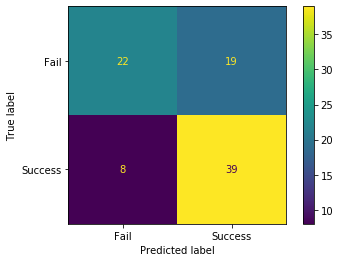

In [14]:
clf_tuned_tree = tree.DecisionTreeClassifier(**clf.best_params_)
clf_tuned_tree.fit(X_train,y_train)
y_tuned_predict = clf_tuned_tree.predict(X_test)
print(classification_report(y_test, y_tuned_predict))

plot_confusion_matrix(clf_tuned_tree,X_test,y_test, display_labels=["Fail","Success"])

<a id='section_id__tree_gridsearch_features'></a>

In [15]:
# get importance
#importance = clf_tuned_tree.feature_importances_

#col_list = df.columns.tolist()

#print(clf_tuned_tree.feature_importances_)

#print(dict(zip(df.columns, clf_tuned_tree.feature_importances_)))

d = dict(zip(df.columns, clf_tuned_tree.feature_importances_))

for w in sorted(d, key=d.get, reverse=True):
    print(w, d[w])
#temp = zip(col_list,clf_tuned_tree.feature_importances_)
#temp = sorted(temp, key=lambda x: x[1])
#print(temp)

# summarize feature importance
#for i,v in enumerate(importance):
    #print('Feature: %0d, Score: %.5f' % (i,v))
    #print('Feature: ', col_list[i], 'Score: ', v)
    
    #print(importance)

#print(df.columns.tolist().shape)

Category 1 1.0
Category 2 0.0
Category 3 0.0
Category 4 0.0
Category 5 0.0
Category 6 0.0
Category 7 0.0
Category 8 0.0
Category 9 0.0
Category 10 0.0
Category 11 0.0
Category 12 0.0
Category 13 0.0
Category 14 0.0
Category 15 0.0
Category 16 0.0
Category 17 0.0
Category 18 0.0
Category 19 0.0
Category 20 0.0
Category 21 0.0
Category 22 0.0
Category 23 0.0
Category 24 0.0
Category 25 0.0
Category 26 0.0
Category 27 0.0
Category 28 0.0
Category 29 0.0
Category 30 0.0
Category 31 0.0
Category 32 0.0
Category 33 0.0
Category 34 0.0
Category 35 0.0
Category 36 0.0
Category 37 0.0
Category 38 0.0
Category 39 0.0
Category 40 0.0
Category 41 0.0


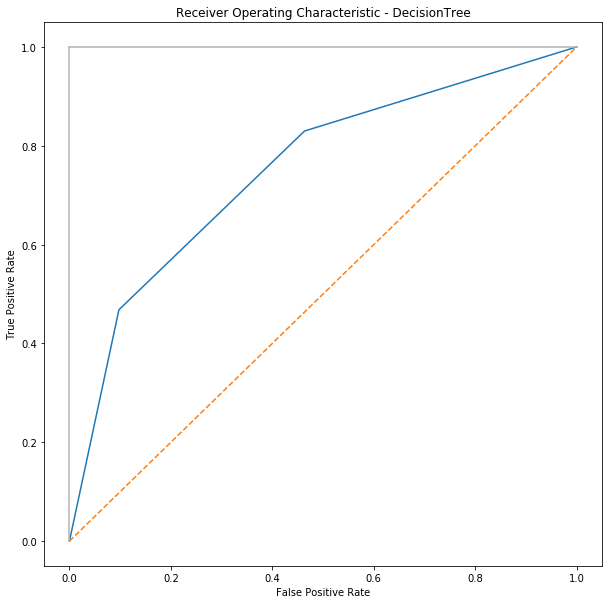

roc_auc_score for DecisionTree:  0.7511676180591593


In [16]:
y_score1 = clf_tuned_tree.predict_proba(X_test)[:,1]

false_positive_rate1, true_positive_rate1, threshold1 = roc_curve(y_test, y_score1)

plt.subplots(1, figsize=(10,10))
plt.title('Receiver Operating Characteristic - DecisionTree')
plt.plot(false_positive_rate1, true_positive_rate1)
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

print('roc_auc_score for DecisionTree: ', roc_auc_score(y_test, y_score1))